In [1]:
#import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
#from sklearn.decomposition import PCA
from sklearn.feature_selection import RFE ,RFECV
from sklearn.feature_selection import SelectKBest,SelectPercentile,chi2
from sklearn.linear_model import LogisticRegression

In [3]:
from sklearn import metrics
from sklearn.metrics import accuracy_score,f1_score
from sklearn.metrics import f1_score,confusion_matrix,roc_auc_score
from sklearn.model_selection import train_test_split,StratifiedKFold

In [4]:
from six import StringIO

In [5]:
import six
import sys
sys.modules['sklearn.externals.six'] = six

In [6]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
from graphviz import Digraph

In [89]:
all_merged=pd.read_csv("C:/Users/Melaku/Desktop/Thesis_02/csv/final01.csv",sep=',',index_col='hhid')

In [90]:
all_merged.sort_index()

,hh_members,hh_education,residence,altitude,Q304,Q306,Q307,Q308m,Qsou_inform,Q504,Q5231,Q5232,Q5233,Q5234,Q524,Q5261,main_occupation,age
hhid,,,,,,,,,,,,,,,,,,
DT0100002,1,0,0,2,1,3,2,0,0,4,1,2,2,2,1,1,2,1
DT0100005,1,1,0,2,1,1,3,2,1,2,1,2,2,2,1,2,3,1
DT0100006,0,3,0,2,1,1,3,2,3,2,2,2,2,2,1,2,4,1
DT0100007,0,3,0,2,1,1,3,2,3,2,2,2,2,2,1,1,4,1
DT0100011,0,3,0,2,1,1,3,0,2,2,1,2,2,2,1,1,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DT1301282,1,0,1,2,1,3,2,0,0,1,2,2,2,2,1,1,2,1
DT1301283,1,1,1,2,1,4,2,1,1,2,2,2,2,2,1,1,2,1
DT1301284,1,3,1,2,1,3,2,1,1,1,1,2,2,2,1,1,2,1


In [91]:
print(type(all_merged))

<class 'pandas.core.frame.DataFrame'>


In [92]:
all_merged.shape

(14093, 18)

In [93]:
all_merged.isnull().sum().sum()

0

In [94]:
all_merged.shape

(14093, 18)

In [95]:
all_merged.columns

Index(['hh_members', 'hh_education', 'residence', 'altitude', 'Q304', 'Q306',
       'Q307', 'Q308m', 'Qsou_inform', 'Q504', 'Q5231', 'Q5232', 'Q5233',
       'Q5234', 'Q524', 'Q5261', 'main_occupation', 'age'],
      dtype='object')

In [96]:
all_merged['hh_members'].value_counts(0)

0    7772
1    5935
2     386
Name: hh_members, dtype: int64

In [97]:
#Here again we identify both independet and depedent variables in to x and y
x=all_merg=all_merged.drop(['food_secured'],axis=1)
y=all_merged['food_secured']

KeyError: "['food_secured'] not found in axis"

In [30]:
#Split the dataset into train and test set 
x_train,x_test,y_train,y_test =train_test_split(x,y, test_size=0.2,random_state=0)

In [31]:
print(x_train.shape,x_test.shape)#show shape of X_train and Y_train 

(11274, 31) (2819, 31)


In [32]:
print(y_train.shape,y_test.shape)

(11274,) (2819,)


In [33]:
#all_merged['target'].replace({2:0},inplace=True)
all_merged['food_secured'].replace({0:"No",1:"Yes"},inplace=True)

In [34]:
all_merged['hh_members'].replace({0:"1-4",1:"5-8",2:">=9"},inplace=True)

1-4    7772
5-8    5935
>=9     386
Name: hh_members, dtype: int64

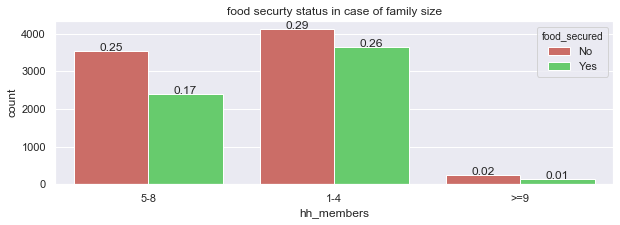

In [35]:
import seaborn as sns
sns.set(style="darkgrid")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="hh_members",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')
ax.set_title('food securty status in case of family size')
plt.savefig('hh_members')
all_merged['hh_members'].value_counts()

In [36]:
all_merged.shape

(14093, 32)

In [37]:
all_merged['sex'].replace({0:"Female",1:"Male"},inplace=True)

Male      10272
Female     3821
Name: sex, dtype: int64

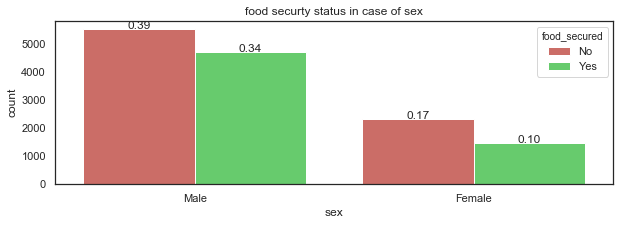

In [38]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="sex",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')
ax.set_title('food securty status in case of sex')
plt.savefig('sex')
all_merged['sex'].value_counts()

In [39]:
all_merged['hh_education'].replace({0:"Illitrate",1:'Elementary',2:"Secondary",3:"Teritary",4:"Teritary"},inplace=True)

Illitrate     7200
Elementary    3311
Secondary     1573
Teritary      1312
4              697
Name: hh_education, dtype: int64

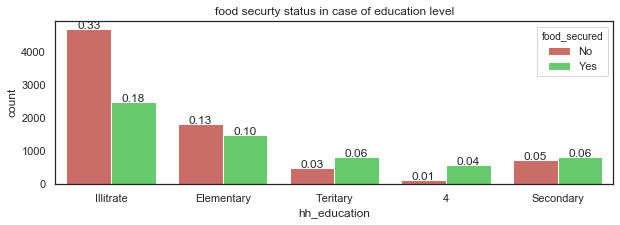

In [40]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="hh_education",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')
ax.set_title('food securty status in case of education level')
plt.savefig('hh_education')
all_merged['hh_education'].value_counts()

In [41]:
all_merged['main_occupation'].replace({0:"Other",1:"Student",2:"Farmer",3:"Self_employmnet",4:"Civl_servant"},inplace=True)

Farmer             10976
Civl_servant        1376
Self_employmnet     1168
Student              397
Other                176
Name: main_occupation, dtype: int64

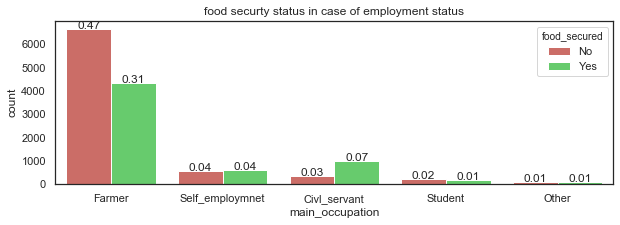

In [42]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="main_occupation",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')
ax.set_title('food securty status in case of employment status')
plt.savefig('main_occupation')
all_merged['main_occupation'].value_counts()

In [43]:
all_merged['marital_status'].replace({0:"Separated",1:"Married",2:"Single",3:"Divorced",4:"Widowed"},inplace=True)

Married      9678
Widowed      1833
Divorced     1347
Single        725
Separated     510
Name: marital_status, dtype: int64

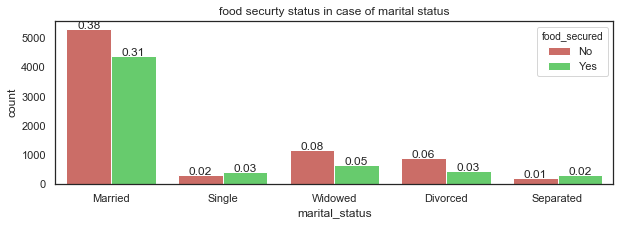

In [44]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="marital_status",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')
ax.set_title('food securty status in case of marital status')
plt.savefig('marital_status')
all_merged['marital_status'].value_counts()

In [45]:
all_merged['age'].replace({0:"15-38",1:"39-60",2:"61-84"},inplace=True)

39-60    6488
15-38    5289
61-84    2316
Name: age, dtype: int64

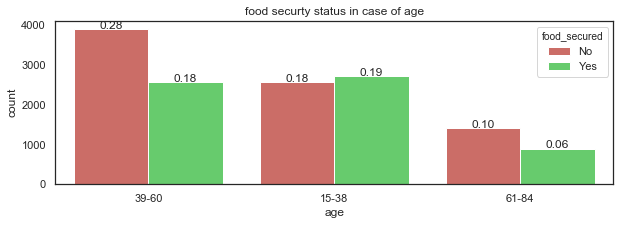

In [46]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="age",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of age')
plt.savefig('age')
all_merged['age'].value_counts()

In [47]:
all_merged['altitude'].replace({0:"Kolla",1:"Woina_dega",2:"Dega"},inplace=True)

Dega          10488
Woina_dega     2111
Kolla          1494
Name: altitude, dtype: int64

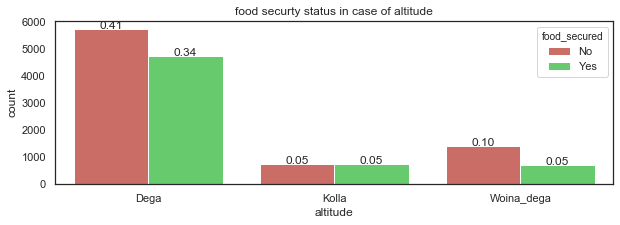

In [48]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="altitude",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of altitude')
plt.savefig('altitude')
all_merged['altitude'].value_counts()

In [49]:
all_merged['Q401'].replace({1:"Clean",0:"Unclean"},inplace=True)

2        7182
Clean    6911
Name: Q401, dtype: int64

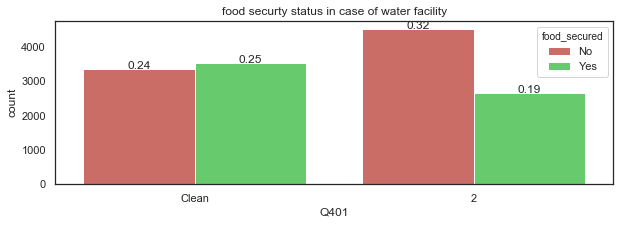

In [50]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q401",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of water facility')
plt.savefig('Q401')
all_merged['Q401'].value_counts()

In [51]:
all_merged['Q406'].replace({1:"Modern",0:"Traditional"},inplace=True)

2         13489
Modern      604
Name: Q406, dtype: int64

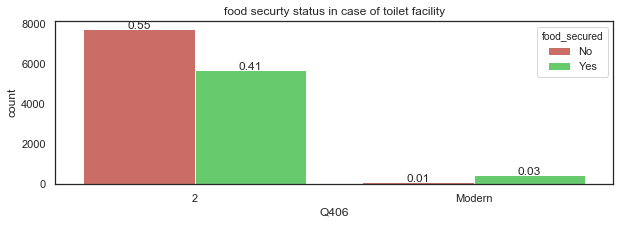

In [52]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q406",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of toilet facility')
plt.savefig('Q406')
all_merged['Q406'].value_counts()

In [53]:
all_merged['residence'].replace({0:"Urban",1:"Rural"},inplace=True)

Rural    9349
Urban    4744
Name: residence, dtype: int64

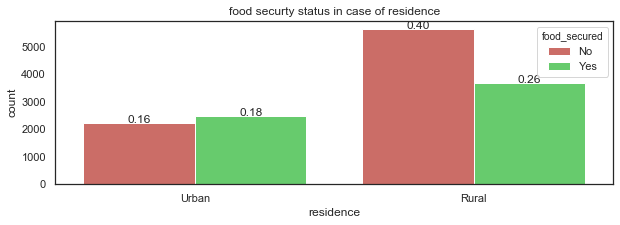

In [54]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="residence",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of residence')
plt.savefig('residence')
all_merged['residence'].value_counts()

In [55]:
all_merged['Q301'].replace({1:"Wood",2:"Tin"},inplace=True)

2       10807
Wood     3286
Name: Q301, dtype: int64

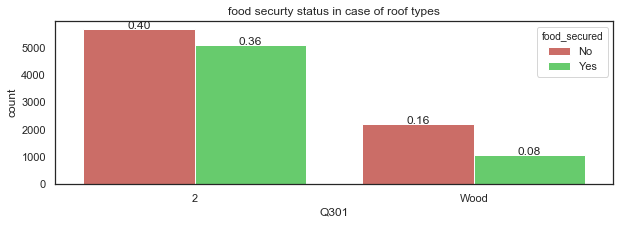

In [56]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q301",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of roof types')
plt.savefig('Q301')
all_merged['Q301'].value_counts()

In [57]:
all_merged['Q304'].replace({1:"Private",2:"Rent",3:"Government"},inplace=True)

Private       11540
Rent           1993
Government      560
Name: Q304, dtype: int64

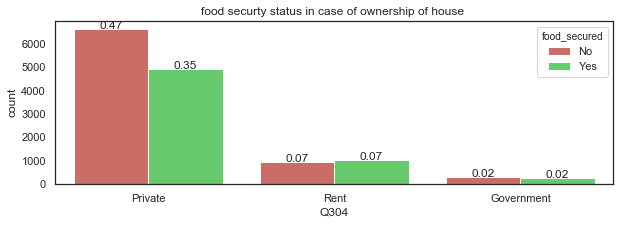

In [58]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q304",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of ownership of house ')
plt.savefig('Q304')
all_merged['Q304'].value_counts()

In [59]:
all_merged['Q306'].replace({1:"Electricity",2:"Kerosene",3:"Battry",4:"Wood/other"},inplace=True)

Battry         8137
Electricity    4493
Wood/other     1376
Kerosene         87
Name: Q306, dtype: int64

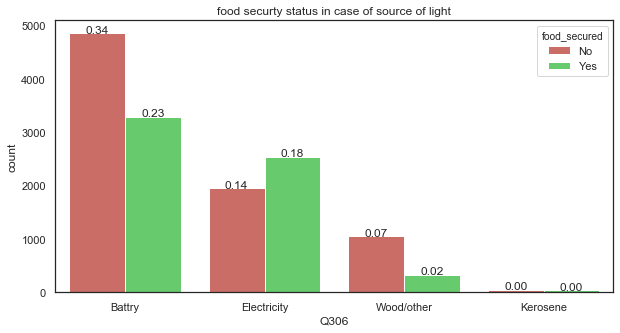

In [60]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,5))
ax=sns.countplot(x="Q306",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of source of light')
plt.savefig('Q306')
all_merged['Q306'].value_counts()

In [61]:
all_merged['Q307'].replace({1:"Wood",2:"Muck",3:"Charcoal",4:"Electricity"},inplace=True)

Muck           9389
Charcoal       3485
Wood           1049
Electricity     170
Name: Q307, dtype: int64

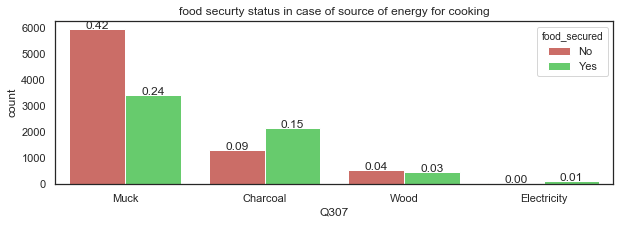

In [62]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q307",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of source of energy for cooking')
plt.savefig('Q307')
all_merged['Q307'].value_counts()

In [63]:
all_merged['Q308m'].replace({0:"Never",1:"0-600",2:"601-1650",3:"1651-3200",4:"3201-5250",5:"5251-7800",6:"7801-10900"},inplace=True)

Never         10707
0-600          1829
601-1650        693
1651-3200       559
3201-5250       210
5251-7800        75
7801-10900       20
Name: Q308m, dtype: int64

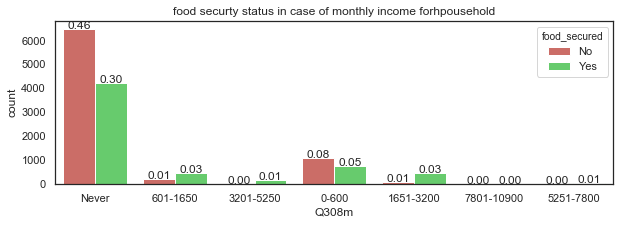

In [65]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q308m",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of monthly income forhpousehold')
plt.savefig('Q308m')
all_merged['Q308m'].value_counts()

In [66]:
all_merged['Qsou_inform'].replace({0:"Never",1:"One_media",2:"Two_media",3:"Three_media"},inplace=True)

Never          9113
One_media      3116
Two_media      1487
Three_media     377
Name: Qsou_inform, dtype: int64

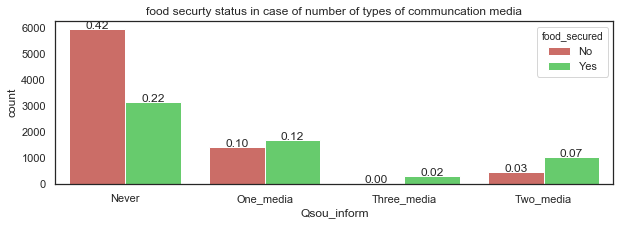

In [67]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Qsou_inform",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of number of types of communcation media')
plt.savefig('Qsou_inform')
all_merged['Qsou_inform'].value_counts()

In [68]:
all_merged['Q501'].replace({0:"Never",1:"1-hec",2:"1-2hec",3:"3-10hec"},inplace=True)

1-2hec     4762
3-10hec    3494
Never      3266
1-hec      1800
4           771
Name: Q501, dtype: int64

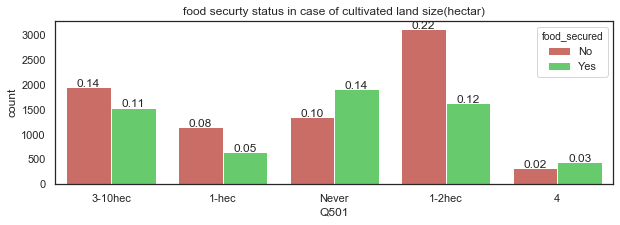

In [69]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q501",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of cultivated land size(hectar)')
plt.savefig('Q501')
all_merged['Q501'].value_counts()

In [70]:
all_merged['Q504'].replace({1:"Own_production",2:"Purchased",3:"Aid",4:"Land_rent",5:"Other"},inplace=True)

Purchased         6655
Own_production    5494
Land_rent          869
Other              754
Aid                321
Name: Q504, dtype: int64

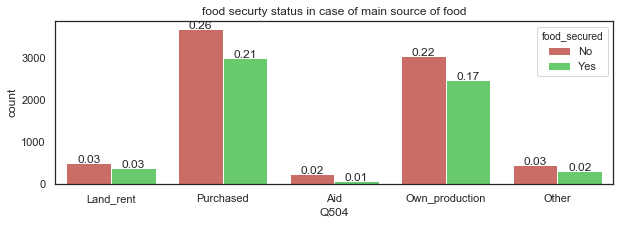

In [71]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q504",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of main source of food')
plt.savefig('Q504')
all_merged['Q504'].value_counts()

In [72]:
all_merged['Q524'].replace({2:"No",1:"Yes"},inplace=True)

No     7226
Yes    6867
Name: Q524, dtype: int64

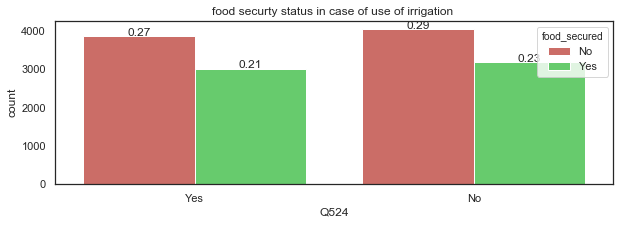

In [73]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q524",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of use of irrigation ')
plt.savefig('Q524')
all_merged['Q524'].value_counts()

In [74]:
all_merged['Q5263'].replace({1:"Yes",2:"No"},inplace=True)

No     12551
Yes     1542
Name: Q5263, dtype: int64

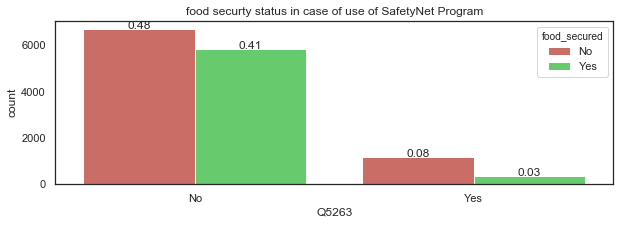

In [75]:
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q5263",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of use of SafetyNet Program')
plt.savefig('Q5263')
all_merged['Q5263'].value_counts()

no     11017
yes     3076
Name: Q5231, dtype: int64

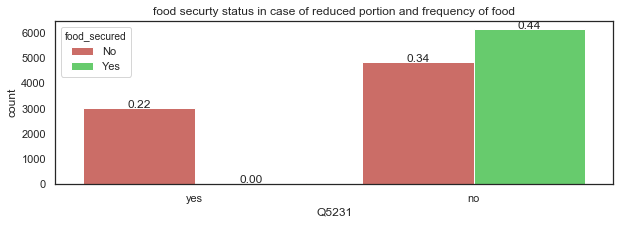

In [76]:
all_merged['Q5231'].replace({1:"yes",2:"no"},inplace=True)
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q5231",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of reduced portion and frequency of food')
plt.savefig('Q5231')
all_merged['Q5231'].value_counts()

No     11726
Yes     2367
Name: Q5232, dtype: int64

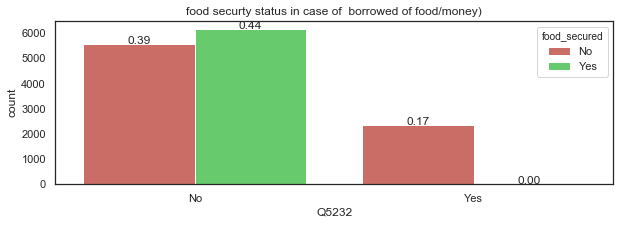

In [77]:
all_merged['Q5232'].replace({1:"Yes",2:"No"},inplace=True)
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q5232",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of  borrowed of food/money)')
plt.savefig('Q5232')
all_merged['Q5232'].value_counts()

In [78]:
    all_merged['Q5233'].replace({1:"Yes",2:"No"},inplace=True)
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q5233",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of Aid of food.money')
plt.savefig('Q5233')
all_merged['Q5233'].value_counts()

IndentationError: expected an indented block (<ipython-input-78-b734628d62a2>, line 8)

No     13420
Yes      673
Name: Q5234, dtype: int64

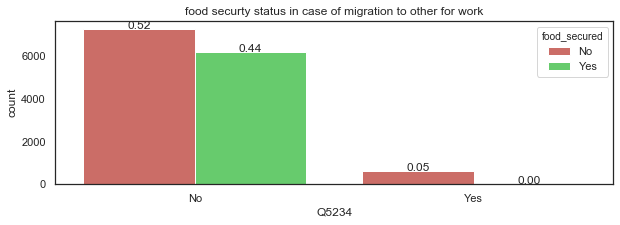

In [79]:
all_merged['Q5234'].replace({1:"Yes",2:"No"},inplace=True)
import seaborn as sns
sns.set(style="white")
sns.set_palette("hls",3)
fig,ax=plt.subplots(figsize=(10,3))
ax=sns.countplot(x="Q5234",hue="food_secured",data=all_merged)
for p in ax.patches:
    height=p.get_height()
    ax.text(p.get_x() +p.get_width()/2.,
            height +3,
            '{:1.2f}'.format(height/all_merged.shape[0]),
            ha='center')

ax.set_title('food securty status in case of migration to other for work')
plt.savefig('Q5234')
all_merged['Q5234'].value_counts()

In [80]:
all_merged.dtypes

hh_members         object
sex                object
hh_education       object
main_occupation    object
marital_status     object
residence          object
age                object
altitude           object
Q401               object
Q406               object
Q301               object
Q302                int64
Q304               object
Q306               object
Q307               object
Q308m              object
Qsou_inform        object
Q3098n              int64
Q3099n              int64
Q30910n             int64
Q30911n             int64
Q501               object
Q503                int64
Q504               object
Q5231              object
Q5232              object
Q5233               int64
Q5234              object
Q524               object
Q5261               int64
Q5263              object
food_secured       object
dtype: object

In [81]:
all_merged

,hh_members,sex,hh_education,main_occupation,marital_status,residence,age,altitude,Q401,Q406,...,Q503,Q504,Q5231,Q5232,Q5233,Q5234,Q524,Q5261,Q5263,food_secured
hhid,,,,,,,,,,,,,,,,,,,,,
DT0100002,5-8,Male,Illitrate,Farmer,Married,Urban,39-60,Dega,Clean,2,...,2,Land_rent,yes,No,2,No,Yes,1,No,No
DT0100005,5-8,Male,Elementary,Self_employmnet,Married,Urban,39-60,Dega,Clean,2,...,2,Purchased,yes,No,2,No,Yes,2,No,No
DT0100006,1-4,Male,Teritary,Civl_servant,Married,Urban,39-60,Dega,Clean,2,...,0,Purchased,no,No,2,No,Yes,2,No,Yes
DT0100007,1-4,Male,Teritary,Civl_servant,Married,Urban,39-60,Dega,Clean,2,...,0,Purchased,no,No,2,No,Yes,1,No,No
DT0100011,1-4,Male,Teritary,Farmer,Single,Urban,15-38,Dega,Clean,2,...,2,Purchased,yes,No,2,No,Yes,1,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DT1301282,5-8,Female,Illitrate,Farmer,Widowed,Rural,39-60,Dega,2,2,...,2,Own_production,no,No,2,No,Yes,1,No,Yes
DT1301283,5-8,Male,Elementary,Farmer,Married,Rural,39-60,Dega,2,2,...,1,Purchased,no,No,2,No,Yes,1,No,No
DT1301284,5-8,Male,Teritary,Farmer,Married,Rural,39-60,Dega,2,2,...,1,Own_production,yes,No,2,No,Yes,1,No,No


In [82]:
from chefboost import Chefboost as chef

In [83]:
#config = {'algorithm': 'C4.5','scoring':'roc_auc'}
#model = chef.fit(all_merged, config)

In [84]:
all_merged.shape

(14093, 32)

In [85]:
#all_merged=pd.read_csv("c://Users/Melaku/Desktop/conda_02/all_merged.txt")
#config = {'algorithm': 'C4.5'}
#model = chef.fit((x_train,y_train), config)

#### Data wrangling 

In [74]:
all_merged

,hh_members,sex,hh_education,main_occupation,marital_status,residence,age,altitude,Q401,Q406,...,Qanimal,Q501,Q504,Q5231,Q5232,Q5233,Q5234,Q524,Q5263,Decision
hhid,,,,,,,,,,,,,,,,,,,,,
DT0100002,5-8,male,illitrate,farmer,married,urban,39-60,Dega,clean,traditional,...,four/four,1-hec,land_rent,yes,no,no,no,yes,no,no
DT0100005,5-8,male,illitrate,self_employmnet,married,urban,39-60,Dega,clean,traditional,...,never,1-hec,purchased,yes,no,no,no,yes,no,no
DT0100006,1-4,male,secondary,civl_servant,married,urban,39-60,Dega,clean,traditional,...,never,never,purchased,no,no,no,no,yes,no,yes
DT0100007,1-4,male,secondary,civl_servant,married,urban,39-60,Dega,clean,traditional,...,one/four,never,purchased,no,no,no,no,yes,no,no
DT0100011,1-4,male,secondary,farmer,single,urban,15-38,Dega,clean,traditional,...,never,1-hec,purchased,yes,no,no,no,yes,no,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DT1301281,5-8,male,illitrate,farmer,married,rural,15-38,Dega,unclean,traditional,...,three/four,1-hec,purchased,yes,yes,no,no,no,no,no
DT1301282,5-8,female,illitrate,farmer,widowed,rural,39-60,Dega,unclean,traditional,...,three/four,1-hec,own production,no,no,no,no,yes,no,yes
DT1301283,5-8,male,illitrate,farmer,married,rural,39-60,Dega,unclean,traditional,...,three/four,1-hec,purchased,no,no,no,no,yes,no,no


In [75]:
Qanimal=pd.crosstab(index=all_merged['Qanimal'],columns=all_merged['Decision'],margins=True)

In [76]:
Qanimal

Decision,no,yes,All
Qanimal,,,
four/four,800,689,1489
never,2003,2140,4143
one/four,1315,739,2054
three/four,1480,982,2462
two/four,1888,1022,2910
All,7486,5572,13058


In [77]:
pd.crosstab(index=all_merged['age'],columns=all_merged['Decision'],margins=True)

Decision,no,yes,All
age,,,
15-38,2508,2603,5111
39-60,3614,2154,5768
61-84,1364,815,2179
All,7486,5572,13058


In [78]:
all_merged.shape

(13058, 28)

In [79]:
all_merged.to_csv("C://Users/Melaku/Desktop/conda_02/final021_nominal.csv")

In [80]:
all_merged=pd.read_csv("C://Users/Melaku/Desktop/conda_02/final021_nominal.csv")

In [81]:
all_merged["hh_members"].value_counts()

1-4    7557
5-8    5136
>=9     365
Name: hh_members, dtype: int64

In [82]:
all_merged.set_index('hhid',inplace=True)

In [83]:
#Here again we identify both independet and depedent variables in to x and y
x=all_merged.drop(['Decision'],axis=1)
y=all_merged['Decision']

In [84]:
#Split the dataset into train and test set 
x_train,x_test,y_train,y_test =train_test_split(x,y, test_size=0.2,random_state=0)


In [85]:
all_merged.shape

(13058, 28)

In [86]:
all_merged.iloc[10:20,15:25]

,Qsou_inform,Qtransport,house_equipment,Qanimal,Q501,Q504,Q5231,Q5232,Q5233,Q5234
hhid,,,,,,,,,,
DT0100020,never,0,never,never,1-hec,purchased,yes,no,no,no
DT0100021,never,0,two_furniture,one/four,1-hec,own production,no,no,no,no
DT0100022,never,1,never,two/four,1-hec,purchased,no,no,no,no
DT0100024,never,0,never,never,1-hec,purchased,yes,no,no,no
DT0100025,one_media,0,one_furniture,never,never,purchased,no,no,no,no
DT0100027,two_media,0,one_furniture,never,1-hec,purchased,no,no,no,yes
DT0100028,never,0,one_furniture,three/four,1-hec,own production,yes,no,no,no
DT0100030,never,0,one_furniture,never,1-hec,purchased,yes,no,no,yes
DT0100031,one_media,0,two_furniture,one/four,1-hec,purchased,no,no,no,no


In [87]:
x_train.dtypes

hh_members         object
sex                object
hh_education       object
main_occupation    object
marital_status     object
residence          object
age                object
altitude           object
Q401               object
Q406               object
Q301               object
Q304               object
Q306               object
Q307               object
Q308m              object
Qsou_inform        object
Qtransport          int64
house_equipment    object
Qanimal            object
Q501               object
Q504               object
Q5231              object
Q5232              object
Q5233              object
Q5234              object
Q524               object
Q5263              object
dtype: object

In [88]:
hybird=['hh_members','hh_education', 'main_occupation','residence', 'age','Q401','Q306', 'Q307', 'Q308m', 'Qsou_inform','house_equipment','Q501','Q5231', 'Q5232', 'Q5233',
       'Q5234']

In [89]:
len(hybird)

16

In [128]:
train=x_train[['hh_members','hh_education', 'main_occupation', 'residence','age',
       'Q401','Q306', 'Q307', 'Q308m', 'Qsou_inform','Q501',
       'Q5231', 'Q5232', 'Q5233', 'Q5234','house_equipment']]


In [91]:
len(train)

10446

In [92]:
test=x_test[['hh_members','hh_education', 'main_occupation', 'residence','age',
       'Q401','Q306', 'Q307', 'Q308m', 'Qsou_inform', 'Q501',
       'Q5231', 'Q5232', 'Q5233', 'Q5234','house_equipment']]

In [93]:
y_train

hhid
DT0501239    yes
DT0600367     no
DT0600547     no
DT0201526     no
DT0700332    yes
            ... 
DT0600160     no
DT0300849     no
DT1101159    yes
DT1200883     no
DT0201396     no
Name: Decision, Length: 10446, dtype: object

In [94]:
y_test

hhid
DT0800167     no
DT0500745    yes
DT0102403    yes
DT0801848    yes
DT0900354     no
            ... 
DT0600411     no
DT0600439     no
DT0500189    yes
DT0601221    yes
DT0802060    yes
Name: Decision, Length: 2612, dtype: object

In [95]:
train=pd.concat([train,y_train],axis=1)
train

,hh_members,hh_education,main_occupation,residence,age,Q401,Q306,Q307,Q308m,Qsou_inform,Q501,Q5231,Q5232,Q5233,Q5234,house_equipment,Decision
hhid,,,,,,,,,,,,,,,,,
DT0501239,1-4,elementary,self_employmnet,rural,15-38,clean,electricity,charcoal,never,never,1-hec,no,no,no,no,one_furniture,yes
DT0600367,>=9,illitrate,farmer,urban,39-60,clean,battry,muck,never,never,1-2hec,no,no,no,no,one_furniture,no
DT0600547,5-8,illitrate,farmer,urban,39-60,unclean,wood/other,muck,never,never,1-2hec,no,yes,no,no,one_furniture,no
DT0201526,1-4,illitrate,farmer,urban,15-38,clean,electricity,charcoal,0-600,never,never,yes,no,no,no,two_furniture,no
DT0700332,1-4,illitrate,self_employmnet,rural,39-60,unclean,battry,muck,0-600,never,never,no,no,no,no,one_furniture,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DT0600160,5-8,illitrate,farmer,urban,39-60,clean,wood/other,muck,never,never,1-hec,yes,yes,no,no,one_furniture,no
DT0300849,5-8,illitrate,farmer,rural,39-60,unclean,battry,muck,never,never,1-hec,yes,yes,no,no,never,no
DT1101159,1-4,elementary,farmer,urban,15-38,clean,electricity,charcoal,never,two_media,never,no,no,no,no,two_furniture,yes


In [96]:
#train=x_train[train]
test=pd.concat([test,y_test],axis=1)

In [97]:
test

,hh_members,hh_education,main_occupation,residence,age,Q401,Q306,Q307,Q308m,Qsou_inform,Q501,Q5231,Q5232,Q5233,Q5234,house_equipment,Decision
hhid,,,,,,,,,,,,,,,,,
DT0800167,5-8,illitrate,farmer,rural,39-60,unclean,battry,muck,never,one_media,1-2hec,no,yes,no,no,one_furniture,no
DT0500745,1-4,illitrate,farmer,rural,39-60,clean,wood/other,muck,never,two_media,1-2hec,no,no,no,no,one_furniture,yes
DT0102403,1-4,secondary,civl_servant,urban,15-38,clean,electricity,charcoal,601-1650,one_media,never,no,no,no,no,two_furniture,yes
DT0801848,1-4,illitrate,farmer,rural,15-38,unclean,battry,muck,never,never,never,no,no,no,no,never,yes
DT0900354,1-4,illitrate,self_employmnet,rural,15-38,clean,electricity,charcoal,0-600,two_media,1-hec,no,no,no,no,one_furniture,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DT0600411,1-4,illitrate,farmer,urban,61-84,clean,battry,muck,never,never,1-2hec,no,yes,no,no,one_furniture,no
DT0600439,5-8,elementary,farmer,urban,39-60,clean,battry,muck,never,one_media,1-hec,no,no,no,no,one_furniture,no
DT0500189,5-8,illitrate,farmer,rural,39-60,unclean,wood/other,muck,never,never,1-hec,no,no,no,no,one_furniture,yes


In [112]:
config = {'algorithm': 'ID3'}
model = chef.fit(train, config)

ID3  tree is going to be built...
Accuracy:  87.1338311315336 % on  10446  instances
finished in  156.77595233917236  seconds


In [101]:
config = {'algorithm': 'ID3'}
model = chef.fit(test, config)

ID3  tree is going to be built...
Accuracy:  91.38591117917305 % on  2612  instances
finished in  47.75311326980591  seconds


In [102]:
config = {'algorithm': 'C4.5'}
model = chef.fit(train, config)

C4.5  tree is going to be built...
Accuracy:  87.1338311315336 % on  10446  instances
finished in  112.21200895309448  seconds


In [98]:
config = {'algorithm': 'C4.5'}
model = chef.fit(test, config)

C4.5  tree is going to be built...
Accuracy:  91.38591117917305 % on  2612  instances
finished in  42.085575342178345  seconds


In [99]:
test.columns

Index(['hh_members', 'hh_education', 'main_occupation', 'residence', 'age',
       'Q401', 'Q306', 'Q307', 'Q308m', 'Qsou_inform', 'Q501', 'Q5231',
       'Q5232', 'Q5233', 'Q5234', 'house_equipment', 'Decision'],
      dtype='object')

In [99]:
test_instance = ['hh_members', 'hh_education', 'main_occupation', 'residence', 'age',
       'Q306','Q308m', 'Qsou_inform', 'Q501', 'Q5231',
       'Q5232', 'Q5233', 'Q5234']
model = chef.fit(test, config)
prediction = chef.predict(model, test_instance)

C4.5  tree is going to be built...
Accuracy:  91.38591117917305 % on  2612  instances
finished in  40.69827842712402  seconds


In [109]:
moduleName = "outputs/rules/rules" #this will load outputs/rules/rules.py
tree = chef.restoreTree(moduleName)
prediction = tree.findDecision(['1-4', 'secondary', 'student', 'rural', '15-38',
       'wood','never', 'two-media', 'never', 'yes',
       'no', 'yes', 'no'])

In [110]:
prediction

'no'

In [111]:
model = chef.fit(test.copy(), config)
chef.save_model(model, "model.pkl")

C4.5  tree is going to be built...
Accuracy:  91.38591117917305 % on  2612  instances
finished in  44.1873562335968  seconds


In [129]:
xx=train[['Q5231','Q5232','house_equipment','Q501','Q401','age','residence','hh_education','Qsou_inform','hh_members','Q308m','Decision']]

KeyError: "['Decision'] not in index"

In [104]:
config = {'algorithm': 'CART'}
model = chef.fit(xx, config)

CART  tree is going to be built...
Accuracy:  87.1338311315336 % on  10446  instances
finished in  108.20699405670166  seconds


In [105]:
config = {'algorithm': 'CART'}
model = chef.fit(test, config)

CART  tree is going to be built...
Accuracy:  91.38591117917305 % on  2612  instances
finished in  35.09795331954956  seconds


In [112]:
rf = {'enableRandomForest': True, 'num_of_trees': 3,'algorithm': 'C4.5'}
model = chef.fit(test, rf)

C4.5  tree is going to be built...


Sub decision tree 3 is processing: 100%|██████████| 3/3 [00:52<00:00, 17.52s/it]


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [113]:
if __name__ == '__main__':
    config = {'algorithm': 'C4.5', 'enableParallelism': True}
    model = chef.fit(test, config)
    fi = chef.feature_importance()
    print(fi)

C4.5  tree is going to be built...
Accuracy:  91.38591117917305 % on  2612  instances
finished in  839.5010530948639  seconds
            feature  final_importance
0             Q5231          0.185212
1             Q5232          0.138943
2   house_equipment          0.104647
3              Q501          0.075289
4              Q401          0.073229
5               age          0.070606
6         residence          0.065618
7      hh_education          0.056154
8       Qsou_inform          0.054941
9        hh_members          0.039967
10            Q308m          0.029384
11            Q5233          0.023242
12  main_occupation          0.022758
13            Q5234          0.022589
14             Q307          0.022216
15             Q306          0.015205


In [107]:
config = {'algorithm': 'C4.5','scoring':'precision'}
model = chef.fit(test, config)

C4.5  tree is going to be built...
Accuracy:  92.53445635528331 % on  2612  instances
finished in  51.77452611923218  seconds


In [123]:
test.iloc[2001]

hh_members                   5-8
hh_education           illitrate
main_occupation           farmer
residence                  rural
age                        39-60
Q401                     unclean
Q306                      battry
Q307                        muck
Q308m                      never
Qsou_inform                never
Q501                       1-hec
Q5231                         no
Q5232                         no
Q5233                         no
Q5234                         no
house_equipment    one_furniture
Decision                      no
Name: DT1200916, dtype: object

In [124]:
test

,hh_members,hh_education,main_occupation,residence,age,Q401,Q306,Q307,Q308m,Qsou_inform,Q501,Q5231,Q5232,Q5233,Q5234,house_equipment,Decision
hhid,,,,,,,,,,,,,,,,,
DT0800167,5-8,illitrate,farmer,rural,39-60,unclean,battry,muck,never,one_media,1-2hec,no,yes,no,no,one_furniture,no
DT0500745,1-4,illitrate,farmer,rural,39-60,clean,wood/other,muck,never,two_media,1-2hec,no,no,no,no,one_furniture,yes
DT0102403,1-4,secondary,civl_servant,urban,15-38,clean,electricity,charcoal,601-1650,one_media,never,no,no,no,no,two_furniture,yes
DT0801848,1-4,illitrate,farmer,rural,15-38,unclean,battry,muck,never,never,never,no,no,no,no,never,yes
DT0900354,1-4,illitrate,self_employmnet,rural,15-38,clean,electricity,charcoal,0-600,two_media,1-hec,no,no,no,no,one_furniture,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DT0600411,1-4,illitrate,farmer,urban,61-84,clean,battry,muck,never,never,1-2hec,no,yes,no,no,one_furniture,no
DT0600439,5-8,elementary,farmer,urban,39-60,clean,battry,muck,never,one_media,1-hec,no,no,no,no,one_furniture,no
DT0500189,5-8,illitrate,farmer,rural,39-60,unclean,wood/other,muck,never,never,1-hec,no,no,no,no,one_furniture,yes


In [125]:
test.iloc[222]

hh_members                   1-4
hh_education           illitrate
main_occupation           farmer
residence                  urban
age                        15-38
Q401                       clean
Q306                      battry
Q307                        muck
Q308m                      never
Qsou_inform                never
Q501                       1-hec
Q5231                         no
Q5232                         no
Q5233                         no
Q5234                         no
house_equipment    one_furniture
Decision                      no
Name: DT0601280, dtype: object

In [126]:
predction=chef.predict(model,test.iloc[222])
predction

'yes'

In [127]:
for index,instance in test.iterrows():
    prediction=chef.predict(model,instance)
    actual=instance['Decision']
    if actual==prediction:
        classified=True
    else:
        classified=False
        print("*",end='')
   
    print(actual,"-",prediction)

no - no
yes - yes
yes - yes
yes - yes
no - no
yes - yes
no - no
no - no
*no - yes
no - no
yes - yes
yes - yes
no - no
yes - yes
no - no
no - no
no - no
no - no
yes - yes
yes - yes
no - no
yes - yes
no - no
yes - yes
*yes - no
yes - yes
no - no
no - no
yes - yes
*no - yes
yes - yes
no - no
yes - yes
no - no
yes - yes
yes - yes
yes - yes
*no - yes
no - no
yes - yes
no - no
no - no
no - no
no - no
yes - yes
no - no
no - no
no - no
yes - yes
yes - yes
yes - yes
no - no
*no - yes
no - no
yes - yes
yes - yes
no - no
yes - yes
yes - yes
no - no
yes - yes
no - no
yes - yes
no - no
*yes - no
yes - yes
no - no
no - no
*no - yes
yes - yes
no - no
*no - yes
no - no
no - no
no - no
yes - yes
yes - yes
*yes - no
no - no
no - no
no - no
yes - yes
*no - yes
yes - yes
no - no
yes - yes
no - no
yes - yes
yes - yes
no - no
yes - yes
yes - yes
no - no
yes - yes
*no - yes
no - no
yes - yes
yes - yes
no - no
no - no
no - no
no - no
no - no
yes - yes
yes - yes
no - no
no - no
no - no
yes - yes
*yes - no
no -

yes - yes
*no - yes
yes - yes
no - no
yes - yes
no - no
*no - yes
yes - yes
no - no
no - no
no - no
yes - yes
yes - yes
no - no
no - no
no - no
no - no
yes - yes
yes - yes
no - no
no - no
yes - yes
no - no
yes - yes
no - no
yes - yes
yes - yes
no - no
*no - yes
*no - yes
yes - yes
yes - yes
no - no
no - no
yes - yes
no - no
no - no
yes - yes
no - no
*no - yes
no - no
no - no
yes - yes
yes - yes
yes - yes
yes - yes
no - no
no - no
yes - yes
no - no
*yes - no
no - no
no - no
yes - yes
yes - yes
no - no
yes - yes
yes - yes
yes - yes
yes - yes
no - no
yes - yes
no - no
no - no
no - no
no - no
yes - yes
yes - yes
no - no
yes - yes
yes - yes
*no - yes
yes - yes
no - no
no - no
yes - yes
no - no
no - no
no - no
no - no
yes - yes
yes - yes
yes - yes
yes - yes
no - no
yes - yes
no - no
yes - yes
yes - yes
no - no
no - no
no - no
no - no
yes - yes
no - no
yes - yes
no - no
*no - yes
no - no
*no - yes
no - no
yes - yes
no - no
no - no
no - no
no - no
no - no
no - no
no - no
yes - yes
yes - yes
no

In [111]:
#def run_randomForest(x_train_chi,x_test_chi,y_train,y_test):
from sklearn.ensemble import RandomForestClassifier
rf_chi2=RandomForestClassifier(n_estimators=100,criterion="entropy",max_depth=10,max_leaf_nodes=100,n_jobs=-1)
rf_chi2.fit(x_train,y_train)
rf=rf_chi2.predict(x_test)
print(metrics.accuracy_score(y_test,rf))

ValueError: could not convert string to float: '1-4'

In [189]:
# import mutual_info_classif,SelectKBest,chi2 and select feature using SelectKBest and mutual_info_classif
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest,chi2
best_mi=SelectKBest(score_func=mutual_info_classif,k=14)
fit_skb_mi=best_mi.fit(x_train,y_train)

ValueError: could not convert string to float: '1-4'

In [190]:
# display both best features and their mi scores
mi_scores=pd.DataFrame(fit_skb_mi.scores_)
mi_columns=pd.DataFrame(x_train.columns)

NameError: name 'fit_skb_mi' is not defined

In [223]:
#concat both features and their mi_scores incase of columns
feat_mi_score=pd.concat([mi_columns,mi_scores],axis=1)

In [224]:
#display columns and mi scores
feat_mi_score.columns=["mutual_info","scores"]
feat_mi_score

,mutual_info,scores
0,hh_members,0.001415
1,sex,0.001721
2,hh_education,0.049318
3,main_occupation,0.022546
4,marital_status,0.006190
5,residence,0.019542
6,age,0.011599
7,altitude,0.004042
8,Q401,0.021026
9,Q406,0.011914


In [225]:
# select maximum of the largest 18 features depending upon their mi_scores
f_mi_score=feat_mi_score.nlargest(18,'scores')
f_mi_score

,mutual_info,scores
27,Q514,0.358796
24,Q508,0.357395
25,Q510,0.353305
28,Q516,0.316861
23,Q506,0.301615
26,Q512,0.193565
29,Q518,0.054217
2,hh_education,0.049318
18,house_equipment,0.039878
15,Q308m,0.039571


In [226]:
#dsiplay best selected features in mi scores
mi_best=x_train.columns[best_mi.get_support()]
mi_best

Index(['hh_education', 'main_occupation', 'Q401', 'Q301', 'Q307', 'Q308m',
       'Qsou_inform', 'house_equipment', 'Q501', 'Q503', 'Q506', 'Q508',
       'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q5263'],
      dtype='object')

In [227]:
#feat

In [228]:
#x_train_mi_fc=x_train[feat]
#x_test_mi_fc=x_test[feat]

In [229]:
#using the mi_best features,aply the train and test set
x_train_mi_fc=x_train[mi_best]
x_test_mi_fc=x_test[mi_best]

In [230]:
x_train_mi_fc

,hh_education,main_occupation,Q401,Q301,Q307,Q308m,Qsou_inform,house_equipment,Q501,Q503,Q506,Q508,Q510,Q512,Q514,Q516,Q518,Q5263
hhid,,,,,,,,,,,,,,,,,,
DT0900285,0,3,1,2,3,1,0,1,0,0,1,1,2,1,1,1,0,2
DT1300849,0,2,2,1,2,0,0,1,1,1,0,0,0,0,0,0,0,2
DT0102134,3,1,1,2,3,0,0,1,0,0,3,3,3,3,2,2,0,2
DT1300342,0,2,1,2,2,0,1,1,2,1,3,1,2,0,0,1,2,1
DT1200866,0,2,2,1,2,0,0,1,1,1,2,1,2,1,1,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DT1202026,3,4,2,2,3,2,1,0,0,0,0,0,1,0,0,0,0,2
DT0300168,1,2,1,2,2,0,0,1,3,1,0,0,0,0,0,0,0,2
DT1000941,0,2,2,1,2,0,1,1,3,2,2,2,2,2,2,2,0,2


In [114]:
#import model selctiom metrics
from sklearn.model_selection import cross_val_score,KFold,cross_val_predict,cross_validate,GridSearchCV

In [280]:
#import random forest classifier from sklearn_ensemble
from sklearn.ensemble import RandomForestClassifier

In [281]:
RandomForestClassifier()

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators='warn',
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [282]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV,StratifiedKFold
rf_mi=RandomForestClassifier()

In [283]:
grid_search={
        'n_estimators':[100,200,300,400],
         'criterion':['gini','entropy'],
         'bootstrap': [True,False]}
         #'max_depth':list(range(2,16)),
        # 'max_leaf_nodes':[50,70,100]
        #}

In [284]:
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
rf_mi_fc = GridSearchCV(estimator = rf, param_grid = grid_search, 
                                scoring='accuracy',
                                cv = 10,n_jobs=-1)

In [285]:
rf_mi_fc.fit(x_train_mi_fc,y_train.values.ravel())

GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             ii

In [286]:
best_parameters=rf_mi_fc.best_params_
best_parameters

{'bootstrap': True, 'criterion': 'gini', 'n_estimators': 300}

In [287]:
best_result=rf_mi_fc.best_score_
best_result

0.9291352093342484

In [288]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [289]:
#def run_randomForest(x_train_mi_fc,x_test_mi_fc,y_train,y_test):
#import random forest classifier from sklearn_ensemble
from sklearn.ensemble import RandomForestClassifier
#deterimne the paramets in randomforest classifiers
rf_mi_fc=RandomForestClassifier(bootstrap=True,n_estimators=400,criterion="entropy",max_depth=10,max_leaf_nodes=100)
#fit the train in case of mutual info classifiers
rf_mi_fc.fit(x_train_mi_fc,y_train.values.ravel())
#predict the model
rf_mi=rf_mi_fc.predict(x_test_mi_fc)
#display the accuracy of the model in case of RF
print(metrics.accuracy_score(y_test,rf_mi))

0.9351629502572899


In [290]:
#using Kfold cross validation n_splits and take the mean accuracy RF in mi classifiers
cv=StratifiedKFold(n_splits=10,random_state=100,shuffle=False)
kfold=cross_val_score(rf_mi_fc,x_train_mi_fc,y_train.values.ravel(),cv=cv)
kf_rf_mi=((kfold.mean()*100))
kf_rf_mi

93.25655821206202

In [291]:
print(metrics.confusion_matrix(y_test,rf_mi))
print(metrics.classification_report(y_test,rf_mi))

[[1532   82]
 [ 107 1194]]
              precision    recall  f1-score   support

           1       0.93      0.95      0.94      1614
           2       0.94      0.92      0.93      1301

    accuracy                           0.94      2915
   macro avg       0.94      0.93      0.93      2915
weighted avg       0.94      0.94      0.94      2915



In [292]:
#%%time
#run_randomForest(x_train_mi_fc,x_test_mi_fc,y_train.values.ravel(),y_test)

In [293]:
DecisionTreeClassifier()

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [295]:
#create a dictionary of all values we want to test
param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(3, 15),'max_leaf_nodes': np.arange(10, 100)}
    # decision tree model
dtree_model=DecisionTreeClassifier()
    #use gridsearch to test all values
dtree_gscv = GridSearchCV(dtree_model, param_grid, cv=10)
    #fit model to data
dtree_gscv.fit(x_train, y_train)
dtree_gscv.best_params_

{'criterion': 'entropy', 'max_depth': 7, 'max_leaf_nodes': 28}

In [296]:
dtree_gscv.best_score_

0.9313658201784488

In [301]:
#def run_randomForest(x_train_mi_fc,x_test_mi_fc,y_train,y_test):
#import Decision tree classifiers classifier from sklearn_tree

#deterimne the paramets in Decision tree classifiers

#fit the train in case of mutual info classifiers

#predict the model

#display the accuracy of the model in case of DT
from sklearn.tree import DecisionTreeClassifier
dt_mi=DecisionTreeClassifier(criterion="entropy",max_depth=7,max_leaf_nodes=28,random_state=42)
dt_mui=dt_mi.fit(x_train_mi_fc,y_train.values.ravel())
dt_mi=dt_mui.predict(x_test_mi_fc)
print((metrics.accuracy_score(y_test,dt_mi)))

0.9313893653516295


In [302]:
#using Kfold cross validation n_splits and take the mean accuracy DT in mi classifiers
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(dt_mui,x_train_mi_fc,y_train.values.ravel(),cv=cv)
kf_dt_mi=(kfold.mean()*100)
kf_dt_mi

92.90492109550553

In [303]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier

In [307]:
#def run_randomForest(x_train_mi_fc,x_test_mi_fc,y_train,y_test):
from sklearn.feature_selection import RFE
rfe_rfc_mi=RFE(RandomForestClassifier(n_estimators=100,random_state=0,criterion='entropy',max_depth=10,max_leaf_nodes=28))
rfe_rfc_mui=rfe_rfc_mi.fit(x_train_mi_fc,y_train.values.ravel())
rfe_rf_mi=rfe_rfc_mui.predict(x_test_mi_fc)
print(metrics.accuracy_score(y_test,rfe_rf_mi))

0.9320754716981132


In [311]:
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(rfe_rfc_mui,x_train_mi_fc,y_train.values.ravel(),cv=cv)
kf_rfe_rf_mi=((kfold.mean()*100))
kf_rfe_rf_mi.round(2)

93.17

In [313]:
#%%time
#run_randomForest(x_train_mi_fc,x_test_mi_fc,y_train.values.ravel(),y_test)

In [314]:
#%%time
#run_randomForest(x_train,x_test,y_train.values.ravel(),y_test)

In [315]:
from sklearn.tree import DecisionTreeClassifier
#def run_randomForest(x_train_mi_fc,x_test_mi_fc,y_train,y_test):
from sklearn.feature_selection import RFE
rfe_dt_mui=RFE(DecisionTreeClassifier(criterion='entropy',max_depth=10,max_leaf_nodes=28))
rfe_dt_mui.fit(x_train_mi_fc,y_train.values.ravel())
rfe_dt_mi=rfe_dt_mui.predict(x_test_mi_fc)
print(metrics.accuracy_score(y_test,rfe_dt_mi))

0.9310463121783876


In [316]:
#%%time
#run_randomForest(x_train_mi_fc,x_test_mi_fc,y_train.values.ravel(),y_test)

In [317]:
#%%time
#run_randomForest(x_train,x_test,y_train.values.ravel(),y_test)

In [318]:
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(rfe_dt_mui,x_train_mi_fc,y_train.values.ravel(),cv=cv)
kf_rfe_dt_mi=((kfold.mean()*100))
kf_rfe_dt_mi.round(2)

92.87

In [320]:
# display accuracy in the form of table for better analysis RF
mi = pd.DataFrame({metrics.accuracy_score(y_test,rf_mi)*100,
                    metrics.accuracy_score(y_test,dt_mi)*100,
                                                           },
       index=['rf_mi','dt_mi'],columns=["Accuracy"])
mi.round(2)

,Accuracy
rf_mi,93.14
dt_mi,93.52


In [321]:
## display accuracy in the form of table for better analysis using RFE in RF and in  mutualinfo classifiers
mi_rfe = pd.DataFrame({metrics.accuracy_score(y_test,rfe_rf_mi)*100,
                   metrics.accuracy_score(y_test,rfe_dt_mi)*100,
                                                    },
       index=['rfe_rf_mi','rfe_dt_mi'],columns=["Accuracy"])
mi_rfe.round(2)

,Accuracy
rfe_rf_mi,93.10
rfe_dt_mi,93.21


In [323]:
# concat both accuracy in case of Rf & RFE with mi
mi_rfe_uni=pd.concat([mi,mi_rfe])
mi_rfe_uni=mi_rfe_uni.sort_values(ascending=False,by=["Accuracy"])
mi_rfe_uni.round(2)

,Accuracy
dt_mi,93.52
rfe_dt_mi,93.21
rf_mi,93.14
rfe_rf_mi,93.10


In [324]:
#display accuracy only using univariate Feature selction i.e mutual_info_classifiers in both DT and RF
kf_mi1 = pd.DataFrame({kf_dt_mi,kf_rf_mi,},
       index=['dt_mi','rf_mi'],columns=["cv"])
kf_mi1.round(2)

,cv
dt_mi,92.90
rf_mi,93.26


In [325]:
#display CV both using univariate Feature selction i.e mutual_info_classifiers in both DT and RF with RFE
kf_mi2 = pd.DataFrame({kf_rfe_rf_mi,
                      kf_rfe_dt_mi,},
       index=['rfe_rf_mi','rfe_dt_mi'],columns=["cv"])
kf_mi2

,cv
rfe_rf_mi,92.870660
rfe_dt_mi,93.170824


In [330]:
#concate  KF cv_acc  of both univarite and RFE in RF and DT in mi classifiers
kf_mi=pd.concat([kf_mi1,kf_mi2])
kf_mi=kf_mi.sort_values(ascending=False,by=["cv"])
kf_mi.round(2)

,cv
rf_mi,93.26
rfe_dt_mi,93.17
dt_mi,92.90
rfe_rf_mi,92.87


 Feature Selection using Chi square

In [331]:
# import the required functions and object.
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest

# change this to how much features you want to keep from the top ones.
select_k =18

# apply the chi2 score on the data and target (target should be binary).  
selection = SelectKBest(chi2, k=select_k).fit(x_train, y_train.values.ravel())

# display the k selected features.
features = x_train.columns[selection.get_support()]
print(features)

Index(['hh_education', 'main_occupation', 'marital_status', 'residence', 'age',
       'Q306', 'Q307', 'Q308m', 'Qsou_inform', 'house_equipment', 'Q501',
       'Q506', 'Q508', 'Q510', 'Q512', 'Q514', 'Q516', 'Q518'],
      dtype='object')


In [332]:
from sklearn.feature_selection import SelectKBest,SelectFromModel,chi2
sb_ch=SelectKBest(score_func=chi2,k=18)
sb_fit=sb_ch.fit(x_train,y_train)
ch_scores=pd.DataFrame(sb_fit.scores_)
ch_columns=pd.DataFrame(x_train.columns)

In [333]:
chi_score=pd.concat([ch_columns,ch_scores],axis=1)

In [334]:
chi_score.columns=["ch_attributes","scores"]
chi_score

,ch_attributes,scores
0,hh_members,33.980178
1,sex,16.984672
2,hh_education,1360.019102
3,main_occupation,74.625368
4,marital_status,81.162828
5,residence,99.340973
6,age,116.334170
7,altitude,2.768203
8,Q401,55.391201
9,Q406,5.110866


In [335]:
ch_sco=chi_score.nlargest(18,'scores')

In [337]:
ch_sco.round(2)

,ch_attributes,scores
27,Q514,8542.83
25,Q510,8467.52
24,Q508,7867.75
28,Q516,7665.87
23,Q506,6758.58
26,Q512,5234.81
29,Q518,1637.25
2,hh_education,1360.02
15,Q308m,1328.35
16,Qsou_inform,1153.61


In [338]:
chi_best=x_train.columns[sb_fit.get_support()]
chi_best

Index(['hh_education', 'main_occupation', 'marital_status', 'residence', 'age',
       'Q306', 'Q307', 'Q308m', 'Qsou_inform', 'house_equipment', 'Q501',
       'Q506', 'Q508', 'Q510', 'Q512', 'Q514', 'Q516', 'Q518'],
      dtype='object')

In [339]:
feat_chi = x_train.columns[selection.get_support()]
print(feat_chi)

Index(['hh_education', 'main_occupation', 'marital_status', 'residence', 'age',
       'Q306', 'Q307', 'Q308m', 'Qsou_inform', 'house_equipment', 'Q501',
       'Q506', 'Q508', 'Q510', 'Q512', 'Q514', 'Q516', 'Q518'],
      dtype='object')


In [340]:
x_train_chi=x_train[chi_best]

In [341]:
x_test_chi=x_test[chi_best]

In [342]:
x_train_chi.shape,x_test_chi.shape

((11656, 18), (2915, 18))

In [345]:
#def run_randomForest(x_train_chi,x_test_chi,y_train,y_test):
from sklearn.tree import DecisionTreeClassifier
dt_chi2=DecisionTreeClassifier(criterion="entropy",max_depth=10,max_leaf_nodes=28)
dt_chi2.fit(x_train_chi,y_train)
dt_chi=dt_chi2.predict(x_test_chi)
print(metrics.accuracy_score(y_test,dt_chi))

0.9313893653516295


In [347]:
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(dt_chi2,x_train_chi,y_train.values.ravel(),cv=cv)
kf_dt_chi=((kfold.mean()*100))
kf_dt_chi.round(2)

93.0

In [348]:
#%%time
#run_randomForest(x_train_chi,x_test_chi,y_train.values.ravel(),y_test)

In [349]:
#%%time
#run_randomForest(x_train,x_test,y_train.values.ravel(),y_test)

In [352]:
#def run_randomForest(x_train_chi,x_test_chi,y_train,y_test):
from sklearn.ensemble import RandomForestClassifier
rf_chi2=RandomForestClassifier(n_estimators=100,criterion="entropy",max_depth=10,max_leaf_nodes=100,n_jobs=-1)
rf_chi2.fit(x_train_chi,y_train.values.ravel())
rf_chi=rf_chi2.predict(x_test_chi)
print(metrics.accuracy_score(y_test,rf_chi))

0.9351629502572899


In [353]:
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(rf_chi2,x_train_chi,y_train.values.ravel(),cv=cv)
kf_rf_chi=((kfold.mean()*100))
kf_rf_chi

93.31673231314659

In [354]:
# dispaly Accuracy in both RF,DT using chi square 
chi = pd.DataFrame({metrics.accuracy_score(y_test,dt_chi)*100,
                   metrics.accuracy_score(y_test,rf_chi)*100,
                   },
       index=['dt_chi','rf_chi'],columns=["Accuracy"])
chi

,Accuracy
dt_chi,93.516295
rf_chi,93.138937


In [355]:
#def run_randomForest(x_train_chi,x_test_chi,y_train,y_test):
from sklearn.feature_selection import RFE
rfe_rfc_chi2=RFE(RandomForestClassifier(n_estimators=100,criterion='entropy',max_depth=10,max_leaf_nodes=50))
rfe_rfc_chi2.fit(x_train_chi,y_train.values.ravel())
rfe_rf_chi=rfe_rfc_chi2.predict(x_test_chi)
print(metrics.accuracy_score(y_test,rfe_rf_chi))

0.9313893653516295


In [356]:
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(rfe_rfc_chi2,x_train_chi,y_train.values.ravel(),cv=cv)
kf_rfe_rf_chi=((kfold.mean()*100))
kf_rfe_rf_chi

93.10215474916426

In [357]:
#def run_randomForest(x_train_chi,x_test_chi,y_train,y_test):
from sklearn.feature_selection import RFE
rfe_dt_chi2=RFE(DecisionTreeClassifier(criterion='entropy',max_depth=10,max_leaf_nodes=50))
rfe_dt_chi2.fit(x_train_chi,y_train.values.ravel())
rfe_dt_chi=rfe_dt_chi2.predict(x_test_chi)
print(metrics.accuracy_score(y_test,rfe_dt_chi))

0.9300171526586621


In [358]:
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(rfe_dt_chi2,x_train_chi,y_train.values.ravel(),cv=cv)
kf_rfe_dt_chi=((kfold.mean()*100))
kf_rfe_dt_chi

92.66476898691117

In [359]:
#%%time
#run_randomForest(x_train_chi,x_test_chi,y_train.values.ravel(),y_test)

In [360]:
#%%time
#run_randomForest(x_train,x_test,y_train.values.ravel(),y_test)

In [361]:
#display accuracy using RF,DT with RFE in Chi2
chi_rfe = pd.DataFrame({metrics.accuracy_score(y_test,rfe_rf_chi)*100,
                   metrics.accuracy_score(y_test,rfe_dt_chi)*100,},
       index=['rfe_rf_chi','rfe_dt_chi'],columns=["Accuracy"])
chi_rfe 

,Accuracy
rfe_rf_chi,93.001715
rfe_dt_chi,93.138937


In [362]:
#concat both acc with and without RFE in[ DT,RF] in chi2
chi2=pd.concat([chi,chi_rfe])
chi_rfe1=chi2.sort_values(ascending=False,by=["Accuracy"])
chi_rfe1

,Accuracy
dt_chi,93.516295
rf_chi,93.138937
rfe_dt_chi,93.138937
rfe_rf_chi,93.001715


In [363]:
# display KFold cv with DT,RF in chi2
kf_chi1 = pd.DataFrame({kf_dt_chi,kf_rf_chi,},
       index=['dt_chi','rf_chi'],columns=["cv"])
kf_chi1

,cv
dt_chi,92.999342
rf_chi,93.316732


In [364]:
## display KFold cv with RFE[DT,RF] in chi2
kf_chi2 = pd.DataFrame({kf_rfe_dt_chi,kf_rfe_rf_chi,},
       index=['rfe_dt_chi','rfe_rf_chi'],columns=["cv"])
kf_chi2

,cv
rfe_dt_chi,92.664769
rfe_rf_chi,93.102155


In [365]:
### display KFold cv in RFE\[DT,RF] in chi2
kf_chi=pd.concat([kf_chi1,kf_chi2])
kf_chi=kf_chi.sort_values(ascending=False,by=["cv"])
kf_chi

,cv
rf_chi,93.316732
rfe_rf_chi,93.102155
dt_chi,92.999342
rfe_dt_chi,92.664769


Features selection using f_classif

In [366]:
# import the required functions and object.
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import SelectKBest

# select the number of features you want to retain.
select_k = 18
# create the SelectKBest with the mutual info strategy.
selection = SelectKBest(f_classif, k=select_k).fit(x_train, y_train.values.ravel())

# display the retained features.
fc_best = x_train.columns[selection.get_support()]
print(fc_best)

Index(['hh_education', 'main_occupation', 'residence', 'Q401', 'Q301', 'Q306',
       'Q307', 'Q308m', 'Qsou_inform', 'house_equipment', 'Q506', 'Q508',
       'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q5263'],
      dtype='object')


In [367]:
fc_best

Index(['hh_education', 'main_occupation', 'residence', 'Q401', 'Q301', 'Q306',
       'Q307', 'Q308m', 'Qsou_inform', 'house_equipment', 'Q506', 'Q508',
       'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q5263'],
      dtype='object')

In [368]:
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import SelectKBest

f_class=SelectKBest(score_func=f_classif,k=18)
f_class=f_class.fit(x_train,y_train.values.ravel())
fc_scores=pd.DataFrame(f_class.scores_)
fc_columns=pd.DataFrame(x_train.columns)

In [369]:
# display the retained features.
fc_best = x_train.columns[f_class.get_support()]
print(fc_best)


Index(['hh_education', 'main_occupation', 'residence', 'Q401', 'Q301', 'Q306',
       'Q307', 'Q308m', 'Qsou_inform', 'house_equipment', 'Q506', 'Q508',
       'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q5263'],
      dtype='object')


In [370]:
x_train_fc=x_train[fc_best]
x_test_fc=x_test[fc_best]

In [371]:
x_train_fc.shape,x_test_fc.shape

((11656, 18), (2915, 18))

In [372]:
f_class_score=pd.concat([fc_columns,fc_scores],axis=1)

In [373]:
f_class_score.columns=["f_classif","scores"]
f_class_score

,f_classif,scores
0,hh_members,50.100874
1,sex,61.376256
2,hh_education,941.625374
3,main_occupation,302.939077
4,marital_status,104.678399
5,residence,285.036161
6,age,181.554641
7,altitude,10.528704
8,Q401,340.186820
9,Q406,220.683960


In [374]:
f_cl=f_class_score.nlargest(18,'scores')

In [375]:
f_cl

,f_classif,scores
24,Q508,12682.970266
25,Q510,12556.881861
27,Q514,12239.554810
23,Q506,10028.501398
28,Q516,9824.025414
26,Q512,4824.910379
16,Qsou_inform,1053.560087
29,Q518,998.101288
2,hh_education,941.625374
18,house_equipment,708.441666


In [376]:
f_best=x_train.columns[f_class.get_support()]
f_best

Index(['hh_education', 'main_occupation', 'residence', 'Q401', 'Q301', 'Q306',
       'Q307', 'Q308m', 'Qsou_inform', 'house_equipment', 'Q506', 'Q508',
       'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q5263'],
      dtype='object')

In [377]:
#def run_randomForest(x_train_fc,x_test_fc,y_train,y_test):
from sklearn.ensemble import RandomForestClassifier
rf_fcc=RandomForestClassifier(n_estimators=100,criterion="entropy",max_depth=10,max_leaf_nodes=100)
rf_fcc.fit(x_train_fc,y_train.values.ravel())
rf_fc=rf_fcc.predict(x_test_fc)
print(metrics.accuracy_score(y_test,rf_fc))

0.9344768439108062


In [378]:
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(rf_fcc,x_train_fc,y_train.values.ravel(),cv=cv)
kf_rf_fc=((kfold.mean()*100))
kf_rf_fc

93.23086598188377

In [379]:
#%%time
#run_randomForest(x_train_fc,x_test_fc,y_train.values.ravel(),y_test)


In [380]:
#%%time
#run_randomForest(x_train,x_test,y_train.values.ravel(),y_test)

In [381]:
#def run_randomForest(x_train_fc,x_test_fc,y_train,y_test):
from sklearn.ensemble import RandomForestClassifier
dt_fcc=DecisionTreeClassifier(criterion="entropy",max_depth=10,max_leaf_nodes=50)
dt_fcc.fit(x_train_fc,y_train.values.ravel())
dt_fc=dt_fcc.predict(x_test_fc)
print(metrics.accuracy_score(y_test,dt_fc))

0.9293310463121783


In [382]:
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(dt_fcc,x_train_fc,y_train.values.ravel(),cv=cv)
kf_dt_fc=((kfold.mean()*100))
kf_dt_fc

92.8449970762492

In [383]:
# %%time
#run_randomForest(x_train_fc,x_test_fc,y_train.values.ravel(),y_test)

In [384]:
#%%time
#run_randomForest(x_train,x_test,y_train.values.ravel(),y_test)

In [385]:
#display accuracy in DT,RF with fclassifiers
fc= pd.DataFrame({metrics.accuracy_score(y_test,rf_fc)*100,
                   metrics.accuracy_score(y_test,dt_fc)*100},
       index=['rf_fc','dt_fc'],columns=["Accuracy"])
fc

,Accuracy
rf_fc,92.933105
dt_fc,93.447684


In [386]:
#def run_randomForest(x_train_fc,x_test_fc,y_train,y_test):
from sklearn.feature_selection import RFE
rfe_rf_fcc=RFE(RandomForestClassifier(n_estimators=100,criterion='entropy',max_depth=10,max_leaf_nodes=50))
rfe_rf_fcc.fit(x_train_fc,y_train.values.ravel())
rfe_rf_fc=rfe_rf_fcc.predict(x_test_fc)
print(metrics.accuracy_score(y_test,rfe_rf_fc))

0.9320754716981132


In [387]:
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(rfe_rf_fcc,x_train_fc,y_train.values.ravel(),cv=cv)
kf_rfe_rf_fc=((kfold.mean()*100))
kf_rfe_rf_fc

93.14504378270831

In [388]:
#%%time
#run_randomForest(x_train_fc,x_test_fc,y_train.values.ravel(),y_test)

In [389]:
# %%time
#run_randomForest(x_train,x_test,y_train.values.ravel(),y_test)

In [390]:
#def run_randomForest(x_train_fc,x_test_fc,y_train,y_test):
from sklearn.feature_selection import RFE
rfe_dt_fcc=RFE(DecisionTreeClassifier(criterion='entropy',max_depth=10,max_leaf_nodes=50))
rfe_dt_fcc.fit(x_train_fc,y_train.values.ravel())
rfe_dt_fc=rfe_dt_fcc.predict(x_test_fc)
print(metrics.accuracy_score(y_test,rfe_dt_fc))

0.9300171526586621


In [391]:
cv=StratifiedKFold(n_splits=10,random_state=0,shuffle=False)
kfold=cross_val_score(rfe_dt_fcc,x_train_fc,y_train.values.ravel(),cv=cv)
kf_rfe_dt_fc=((kfold.mean()*100))
kf_rfe_dt_fc

92.69905961877231

In [392]:
 #%%time
#run_randomForest(x_train_fc,x_test_fc,y_train.values.ravel(),y_test)

In [393]:
# %%time
#run_randomForest(x_train,x_test,y_train.values.ravel(),y_test)

In [394]:
#x_train_f_class=x_train[fc_best]

In [395]:
#x_test_f_class=x_test[fc_best]

In [396]:
x_train_fc.shape,x_test_fc.shape

((11656, 18), (2915, 18))

In [397]:
feat

Index(['hh_education', 'main_occupation', 'Q401', 'Q306', 'Q307', 'Q308m',
       'Qsou_inform', 'house_equipment', 'Q501', 'Q503', 'Q506', 'Q508',
       'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q5263'],
      dtype='object')

In [398]:
# call best features in mutual_info_classifiers
mi_best

Index(['hh_education', 'main_occupation', 'Q401', 'Q306', 'Q307', 'Q308m',
       'Qsou_inform', 'house_equipment', 'Q501', 'Q503', 'Q506', 'Q508',
       'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q5263'],
      dtype='object')

In [399]:
## call best features in chi-square
chi_best

Index(['hh_education', 'main_occupation', 'marital_status', 'residence', 'age',
       'Q306', 'Q307', 'Q308m', 'Qsou_inform', 'house_equipment', 'Q501',
       'Q506', 'Q508', 'Q510', 'Q512', 'Q514', 'Q516', 'Q518'],
      dtype='object')

In [400]:
## call best features in fclassifiers
f_best

Index(['hh_education', 'main_occupation', 'residence', 'Q401', 'Q301', 'Q306',
       'Q307', 'Q308m', 'Qsou_inform', 'house_equipment', 'Q506', 'Q508',
       'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q5263'],
      dtype='object')

In [401]:
#display accuracy in RFE\DT,RF in Fclassifiers
fc_rfe = pd.DataFrame({metrics.accuracy_score(y_test,rfe_rf_fc)*100,
                   metrics.accuracy_score(y_test,rfe_dt_fc)*100},
       index=['rfe_rf_fc','rfe_dt_fc'],columns=["Accuracy"])
fc_rfe

,Accuracy
rfe_rf_fc,93.001715
rfe_dt_fc,93.207547


In [402]:
#display both accuracy in RFE\DT,RF using fclassifiers
fc_=pd.concat([fc,fc_rfe])
fcla=fc_.sort_values(ascending=False,by=["Accuracy"])
fcla

,Accuracy
dt_fc,93.447684
rfe_dt_fc,93.207547
rfe_rf_fc,93.001715
rf_fc,92.933105


In [403]:
#call accuracy using mutuai_info_classifiers
mi

,Accuracy
rf_mi,93.138937
dt_mi,93.516295


In [404]:
##call accuracy using chi2
chi

,Accuracy
dt_chi,93.516295
rf_chi,93.138937


In [405]:
##call accuracy using fclassifiers
fc

,Accuracy
rf_fc,92.933105
dt_fc,93.447684


In [406]:
##call all accuracy using mutuai_info_classifiers together
mi_chi_fc=pd.concat([mi,chi,fc])
mi_chi_fc=mi_chi_fc.sort_values(ascending=False,by=["Accuracy"])
mi_chi_fc

,Accuracy
dt_mi,93.516295
dt_chi,93.516295
dt_fc,93.447684
rf_mi,93.138937
rf_chi,93.138937
rf_fc,92.933105


In [407]:
# call accuracy using RFE in mi[DT,RF]
mi_rfe

,Accuracy
rfe_rf_mi,93.104631
rfe_dt_mi,93.207547


In [408]:
## call accuracy using RFE in chi2 [DT,RF]
chi_rfe

,Accuracy
rfe_rf_chi,93.001715
rfe_dt_chi,93.138937


In [409]:
## call accuracy using RFE in fc [DT,RF]
fc_rfe

,Accuracy
rfe_rf_fc,93.001715
rfe_dt_fc,93.207547


In [410]:
###call all accuracy in RFE[DT,RF] using mi,chi2,fc
mi_chi_fc_rfe=pd.concat([mi_rfe,chi_rfe,fc_rfe])
mi_chi_fc_rfe=mi_chi_fc_rfe.sort_values(ascending=False,by=["Accuracy"])
mi_chi_fc_rfe

,Accuracy
rfe_dt_mi,93.207547
rfe_dt_fc,93.207547
rfe_dt_chi,93.138937
rfe_rf_mi,93.104631
rfe_rf_chi,93.001715
rfe_rf_fc,93.001715


In [411]:
#call accuracy in mi RFE[DT,RF]
mi_rfe_uni

,Accuracy
dt_mi,93.516295
rfe_dt_mi,93.207547
rf_mi,93.138937
rfe_rf_mi,93.104631


In [412]:
##call accuracy in chi2 RFE[DT,RF]
chi_rfe1

,Accuracy
dt_chi,93.516295
rf_chi,93.138937
rfe_dt_chi,93.138937
rfe_rf_chi,93.001715


In [413]:
##call accuracy in fc RFE[DT,RF]
fcla

,Accuracy
dt_fc,93.447684
rfe_dt_fc,93.207547
rfe_rf_fc,93.001715
rf_fc,92.933105


In [414]:
#call kfold cv in fc [DT,RF]
kf_fc1 = pd.DataFrame({kf_dt_fc,kf_rf_fc,},
       index=['dt_fc','rf_fc'],columns=["cv"])
kf_fc1

,cv
dt_fc,92.844997
rf_fc,93.230866


In [415]:
#call kfold cv in fc RFE\[DT,RF]
kf_fc2 = pd.DataFrame({kf_rfe_rf_fc,kf_rfe_dt_fc,},
       index=['rfe_rf_fc','rfe_dt_fc'],columns=["cv"])
kf_fc2

,cv
rfe_rf_fc,92.699060
rfe_dt_fc,93.145044


In [416]:
#call kfold cv in fc in RFE [DT,RF]
kf_fc=pd.concat([kf_fc1,kf_fc2])
kf_fckf_fc=kf_fc.sort_values(ascending=False,by=["cv"])
kf_fc

,cv
dt_fc,92.844997
rf_fc,93.230866
rfe_rf_fc,92.699060
rfe_dt_fc,93.145044


In [417]:
#call kfold cv in [mi,chi2,fc [DT,RF]]
kf_mi_chi_fc=pd.concat([kf_mi1,kf_chi1,kf_fc1])
kf_mi_chi_fc=kf_mi_chi_fc.sort_values(ascending=False,by=["cv"])
kf_mi_chi_fc

,cv
rf_chi,93.316732
rf_mi,93.256558
rf_fc,93.230866
dt_chi,92.999342
dt_mi,92.904921
dt_fc,92.844997


In [418]:
#call kfold cv and accuracy  in [mi,chi2,fc [DT,RF]]
uni_acc_cv=pd.concat([mi_chi_fc,kf_mi_chi_fc],axis=1)
uni_acc_cv=uni_acc_cv.sort_values(ascending=False,by=["Accuracy"])
uni_acc_cv.round(2)

,Accuracy,cv
dt_chi,93.52,93.00
dt_mi,93.52,92.90
dt_fc,93.45,92.84
rf_chi,93.14,93.32
rf_mi,93.14,93.26
rf_fc,92.93,93.23


In [419]:
#call kfold cv in [mi,chi2,fc,RFE\ [DT,RF]]
kf_mi_chi_fc_rfe=pd.concat([kf_mi2,kf_chi2,kf_fc2])
kf_mi_chi_fc_rfe=kf_mi_chi_fc_rfe.sort_values(ascending=False,by=["cv"])
kf_mi_chi_fc_rfe

,cv
rfe_dt_mi,93.170824
rfe_dt_fc,93.145044
rfe_rf_chi,93.102155
rfe_rf_mi,92.870660
rfe_rf_fc,92.699060
rfe_dt_chi,92.664769


In [420]:
#call kfold cv in RFE\[mi,chi2,fc [DT,RF]]
Filter_method1=pd.concat([kf_mi_chi_fc,kf_mi_chi_fc_rfe],axis=0)
Filter_method1=Filter_method1.sort_values(ascending=False,by=["cv"])
Filter_method1.round(2)

,cv
rf_chi,93.32
rf_mi,93.26
rf_fc,93.23
rfe_dt_mi,93.17
rfe_dt_fc,93.15
rfe_rf_chi,93.10
dt_chi,93.00
dt_mi,92.90
rfe_rf_mi,92.87
dt_fc,92.84


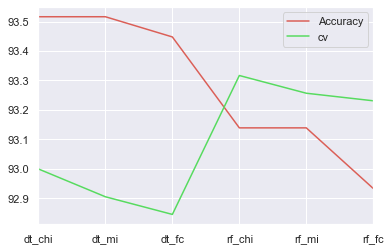

In [421]:
#visualize accuracy and kfoldcv for mi,chi2,fc in [RF,DT]
uni_acc_cv.plot()

In [422]:
#call accuracy and Kfold cv ,RFE in[mi,chi2,fc,[DT,RFE]]
rfe_acc_cv=pd.concat([mi_chi_fc_rfe,kf_mi_chi_fc_rfe],axis=1)
rfe_acc_cv=rfe_acc_cv.sort_values(ascending=False,by=["Accuracy"])
rfe_acc_cv.round(2)

,Accuracy,cv
rfe_dt_fc,93.21,93.15
rfe_dt_mi,93.21,93.17
rfe_dt_chi,93.14,92.66
rfe_rf_mi,93.10,92.87
rfe_rf_chi,93.00,93.10
rfe_rf_fc,93.00,92.70


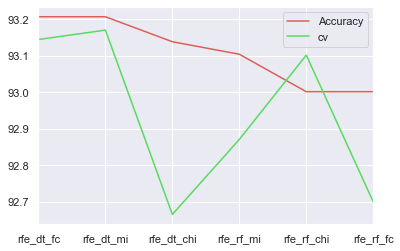

In [423]:
# visualize accuracy and cv RFE[DT,RF]
rfe_acc_cv.plot()

In [424]:
#dispaly all accuracy RFE[DT,RF[mi,chi2,fc]]
all_acc=pd.concat([mi_rfe_uni,chi_rfe1,fcla])
all_acc=all_acc.sort_values(ascending=False,by=["Accuracy"])
all_acc.round(2)

,Accuracy
dt_mi,93.52
dt_chi,93.52
dt_fc,93.45
rfe_dt_mi,93.21
rfe_dt_fc,93.21
rf_mi,93.14
rf_chi,93.14
rfe_dt_chi,93.14
rfe_rf_mi,93.10
rfe_rf_chi,93.00


In [425]:
#dispaly all kfold cv RFE[DT,RF[mi,chi2,fc]]
all_cv=pd.concat([kf_mi,kf_chi,kf_fc])
all_cv=all_cv.sort_values(ascending=False,by=["cv"])
all_cv.round(2)

,cv
rf_chi,93.32
rf_mi,93.26
rf_fc,93.23
rfe_dt_mi,93.17
rfe_dt_fc,93.15
rfe_rf_chi,93.10
dt_chi,93.00
dt_mi,92.90
rfe_rf_mi,92.87
dt_fc,92.84


In [426]:
#dispaly all accuracy and cv in  RFE|&[DT,RF[mi,chi2,fc]]
rfe_uni_acc_cv=pd.concat([uni_acc_cv,rfe_acc_cv])
rfe_uni_acc_cv=rfe_uni_acc_cv.sort_values(ascending=False,by=["Accuracy"])
rfe_uni_acc_cv.fillna("").round(2)

,Accuracy,cv
dt_chi,93.52,93.00
dt_mi,93.52,92.90
dt_fc,93.45,92.84
rfe_dt_fc,93.21,93.15
rfe_dt_mi,93.21,93.17
rf_chi,93.14,93.32
rf_mi,93.14,93.26
rfe_dt_chi,93.14,92.66
rfe_rf_mi,93.10,92.87
rfe_rf_chi,93.00,93.10


In [427]:
#dispaly all accuracy and cv in  RFE|&[DT,RF[mi,chi2,fc]] in general without specifity
Filter_method=pd.concat([all_acc,all_cv],axis=1)
Filter_method=Filter_method.sort_values(ascending=False,by=["cv"])
Filter_method.fillna("").round(2)

,Accuracy,cv
rf_chi,93.14,93.32
rf_mi,93.14,93.26
rf_fc,92.93,93.23
rfe_dt_mi,93.21,93.17
rfe_dt_fc,93.21,93.15
rfe_rf_chi,93.00,93.10
dt_chi,93.52,93.00
dt_mi,93.52,92.90
rfe_rf_mi,93.10,92.87
dt_fc,93.45,92.84


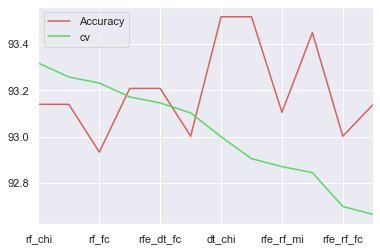

In [428]:
Filter_method.plot()
plt.show()

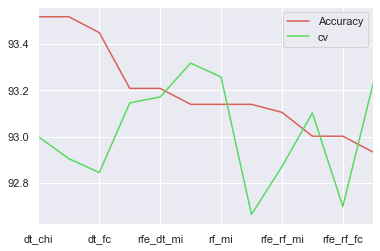

In [429]:
rfe_uni_acc_cv.plot()

## Feature Importances 

In [430]:
from sklearn.ensemble import RandomForestClassifier

# create the random forest with your hyperparameters.
model = RandomForestClassifier(n_estimators=100)

# fit the model to start training.
model.fit(x_train, y_train.values.ravel())

# get the importance of the resulting features.
importances = model.feature_importances_

# create a data frame for visualization.
final_df = pd.DataFrame({"Features": x_train.columns, "Importances":importances})
final_df.set_index('Importances')

# sort in ascending order to better visualization.
final_df = final_df.sort_values('Importances')


In [431]:
importance=final_df.nlargest(18,'Importances')
importance

,Features,Importances
25,Q510,0.209148
27,Q514,0.176287
24,Q508,0.148240
28,Q516,0.114689
23,Q506,0.073178
26,Q512,0.040081
16,Qsou_inform,0.017630
22,Q504,0.016019
2,hh_education,0.015459
20,Q501,0.015082


In [432]:
imp_score=pd.DataFrame(final_df)


In [433]:
imp_score

,Features,Importances
11,Q302,0.000422
9,Q406,0.001137
12,Q304,0.003971
1,sex,0.004359
32,Q5263,0.004611
5,residence,0.005175
10,Q301,0.005551
8,Q401,0.005746
17,Qtransport,0.005869
3,main_occupation,0.007355


In [434]:
#mi_best=mutual info classifaction
#chi_best= best feature using chi square 
#f_best=best feature using f_classif
df = pd.DataFrame({'mi_best': mi_best,
           'chi_best':chi_best,
            'f_best':f_best},
       columns=['mi_best', 'chi_best', 'f_best'])
df

,mi_best,chi_best,f_best
0,hh_education,hh_education,hh_education
1,main_occupation,main_occupation,main_occupation
2,Q401,marital_status,residence
3,Q306,residence,Q401
4,Q307,age,Q301
5,Q308m,Q306,Q306
6,Qsou_inform,Q307,Q307
7,house_equipment,Q308m,Q308m
8,Q501,Qsou_inform,Qsou_inform
9,Q503,house_equipment,house_equipment


In [435]:
score=pd.concat([mi_columns,mi_scores,ch_columns,ch_scores,fc_columns,fc_scores,imp_score],axis=1)      

In [439]:
score.columns=['mut_info_att','mut_info_attr_score','chi_attr','chi_attr_score','fclass_attr','fclass_attr_score','importance','imp_score']
score.round(4)

,mut_info_att,mut_info_attr_score,chi_attr,chi_attr_score,fclass_attr,fclass_attr_score,importance,imp_score
0,hh_members,0.0068,hh_members,33.9802,hh_members,50.1009,hh_members,0.0106
1,sex,0.0031,sex,16.9847,sex,61.3763,sex,0.0044
2,hh_education,0.0422,hh_education,1360.0191,hh_education,941.6254,hh_education,0.0155
3,main_occupation,0.0290,main_occupation,74.6254,main_occupation,302.9391,main_occupation,0.0074
4,marital_status,0.0131,marital_status,81.1628,marital_status,104.6784,marital_status,0.0074
5,residence,0.0077,residence,99.3410,residence,285.0362,residence,0.0052
6,age,0.0168,age,116.3342,age,181.5546,age,0.0111
7,altitude,0.0000,altitude,2.7682,altitude,10.5287,altitude,0.0079
8,Q401,0.0172,Q401,55.3912,Q401,340.1868,Q401,0.0057
9,Q406,0.0096,Q406,5.1109,Q406,220.6840,Q406,0.0011


In [631]:
print(score.nlargest(18,['chi_attr_score']))

       mut_info_att  mut_info_attr_score         chi_attr  chi_attr_score  \
27             Q514             0.360024             Q514     8542.825123   
25             Q510             0.358711             Q510     8467.524419   
24             Q508             0.354574             Q508     7867.753576   
28             Q516             0.318522             Q516     7665.872400   
23             Q506             0.304825             Q506     6758.581838   
26             Q512             0.194080             Q512     5234.811750   
29             Q518             0.059474             Q518     1637.250168   
2      hh_education             0.042156     hh_education     1360.019102   
15            Q308m             0.042247            Q308m     1328.354736   
16      Qsou_inform             0.037117      Qsou_inform     1153.612216   
18  house_equipment             0.046325  house_equipment      356.391416   
13             Q306             0.029058             Q306      242.680965   

In [632]:
best_attributes=pd.concat([f_mi_score,ch_sco,f_cl,importance],axis=1) 
best_attributes.fillna("").round(4)

,mutual_info,scores,ch_attributes,scores,f_classif,scores,Features,Importances
0,,,,,,,hh_members,0.0106175
2,hh_education,0.0421561,hh_education,1360.02,hh_education,941.625,hh_education,0.0154593
3,main_occupation,0.0290456,main_occupation,74.6254,main_occupation,302.939,,
4,,,marital_status,81.1628,,,,
5,,,residence,99.341,residence,285.036,,
6,,,age,116.334,,,age,0.0111122
8,Q401,0.0171683,,,Q401,340.187,,
10,,,,,Q301,311.15,,
13,Q306,0.0290583,Q306,242.681,Q306,550.072,,
14,Q307,0.0385682,Q307,68.8997,Q307,466.348,,


In [633]:
Filter_method.round(2)

,Accuracy,cv
rf_chi,93.14,93.32
rf_mi,93.14,93.26
rf_fc,92.93,93.23
rfe_dt_mi,93.21,93.17
rfe_dt_fc,93.21,93.15
rfe_rf_chi,93.00,93.10
dt_chi,93.52,93.00
dt_mi,93.52,92.90
rfe_rf_mi,93.10,92.87
dt_fc,93.45,92.84


In [634]:
importance=final_df.nlargest(18,'Importances')
importance

,Features,Importances
25,Q510,0.209148
27,Q514,0.176287
24,Q508,0.148240
28,Q516,0.114689
23,Q506,0.073178
26,Q512,0.040081
16,Qsou_inform,0.017630
22,Q504,0.016019
2,hh_education,0.015459
20,Q501,0.015082


Univariate ROC-AUC /RMSE

In [635]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score

# list of the resulting scores.
roc_values = []

# loop over all features and calculate the score.
for feature in x_train.columns:
    clf = DecisionTreeClassifier()
    clf.fit(x_train[feature].to_frame(), y_train)
    y_scored = clf.predict_proba(x_test[feature].to_frame())
    roc_values.append(roc_auc_score(y_test, y_scored[:, 1]))

# create a Pandas Series for visualisation.
roc_values = pd.Series(roc_values)
roc_values.index = x_train.columns

# show the results.
print(roc_values.sort_values(ascending=False))

Q508               0.900224
Q510               0.892374
Q506               0.883845
Q514               0.883211
Q516               0.864757
Q512               0.757433
hh_education       0.645896
Qsou_inform        0.633829
house_equipment    0.630921
Q307               0.624497
Q501               0.617064
Q306               0.608788
Q503               0.605587
Q401               0.600815
Q308m              0.595578
main_occupation    0.588802
Q518               0.582380
age                0.568698
Q301               0.564273
residence          0.563972
Qanimal            0.561145
marital_status     0.558794
Q5263              0.555218
altitude           0.546068
sex                0.536094
Q406               0.527457
hh_members         0.526291
Q304               0.523781
Q5261              0.519778
Qtransport         0.515069
Q504               0.511539
Q302               0.511239
Q525               0.502031
dtype: float64


In [636]:
all_merged[['Qanimal']]

,Qanimal
hhid,
DT0100002,4
DT0100005,0
DT0100006,0
DT0100007,1
DT0100011,0
...,...
DT1301282,3
DT1301283,3
DT1301284,4


In [637]:
importance=final_df.nlargest(18,'Importances')
importance


,Features,Importances
25,Q510,0.209148
27,Q514,0.176287
24,Q508,0.148240
28,Q516,0.114689
23,Q506,0.073178
26,Q512,0.040081
16,Qsou_inform,0.017630
22,Q504,0.016019
2,hh_education,0.015459
20,Q501,0.015082


In [638]:
x_train.shape,x_test.shape

((11656, 33), (2915, 33))

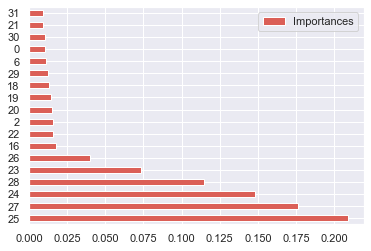

In [639]:
importance.plot.barh()

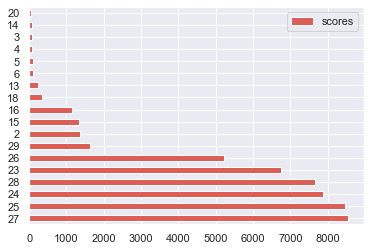

In [640]:
ch_sco.plot.barh()

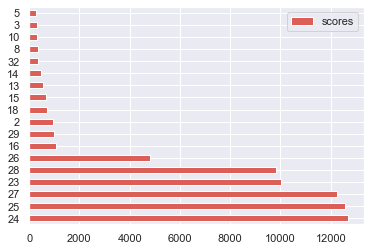

In [641]:
f_cl.plot.barh()

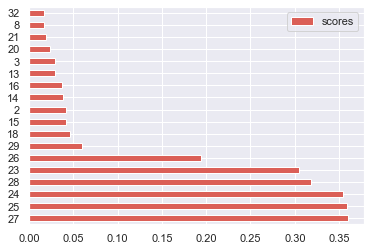

In [642]:
f_mi_score.plot.barh()

Correlation Matrix with Heatmap

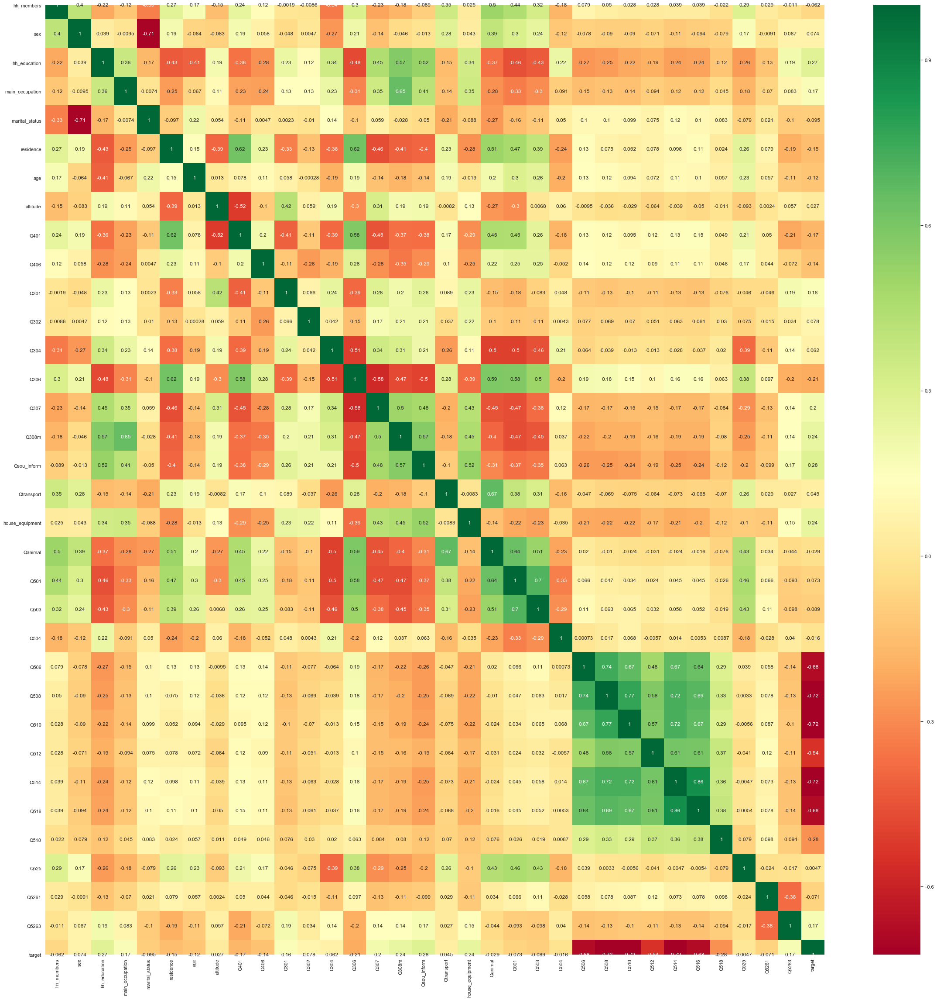

In [643]:
import seaborn as sns
cormatx=all_merged.corr(method="spearman")
top_corr_features=cormatx.index
plt.figure(figsize=(40,40))
corr_heatmap=sns.heatmap(all_merged[top_corr_features].corr(),annot=True,cmap="RdYlGn")
plt.savefig("visualzation.png")

In [644]:
all_merged.shape

(14571, 34)

In [645]:
from sklearn.feature_selection import SelectFromModel
clf =SelectFromModel(RandomForestClassifier(n_estimators=100, random_state=0, n_jobs=-1))
# Train the classifier
clf.fit(x_train, y_train.values.ravel())
clf.get_support()
selected_feat=x_train.columns[(clf.get_support())]
print("number of features:",len(selected_feat))
print()
print("selected features :",selected_feat)

# Print the name and gini importance of each feature
#for feature in zip(x_train.columns, clf.feature_importances_):
 #   print(feature)

number of features: 6

selected features : Index(['Q506', 'Q508', 'Q510', 'Q512', 'Q514', 'Q516'], dtype='object')


#### Wrapper Feature selction methods

Library to install

In [455]:
# command for pip  such as  pip "install mlxtend"

Forward Feature Selection
Also known as step forward feature selection (or sequential forward feature selection — SFS), this is an iterative method in which we start by evaluating all features individually, and then select the one that results in the best performance.

In [456]:
#pip install mlxtend

In [524]:
from sklearn.ensemble import RandomForestClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

k_features: The maximum feature to be reached when starting from 0.
forward: Use step forward or step backward feature selection.
floating: step floating forward selection.
scoring: evaluate model performance
cv: The number of folds of K-fold cross-validation

In [525]:
# create the SequentialFeatureSelector object, and configure the parameters.
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

sfs = SFS(RandomForestClassifier(max_depth=10,max_leaf_nodes=100,criterion='entropy',n_estimators=100), 
           k_features=18, 
           forward=True, 
           floating=False,
           scoring='accuracy',
           cv=10)

In [526]:
# fit the object to the training data.
sfs = sfs.fit(x_train,y_train.values.ravel())

In [527]:
# print the selected features.
sfs_featueres = x_train.columns[list(sfs.k_feature_idx_)]
print(sfs_featueres)

Index(['sex', 'main_occupation', 'marital_status', 'residence', 'Q401', 'Q406',
       'Q304', 'Qsou_inform', 'Qanimal', 'Q501', 'Q503', 'Q504', 'Q508',
       'Q510', 'Q514', 'Q516', 'Q518', 'Q525'],
      dtype='object')


In [528]:
# print the final prediction score.
print(sfs.k_score_)
# transform to the newly selected features.
x_train_sfs = sfs.transform(x_train)
x_test_sfs = sfs.transform(x_test)

0.9338538713034781


In [529]:
x_train_sfs.shape,x_test_sfs.shape

((11656, 18), (2915, 18))

In [530]:
x_train_sfs

array([[0, 3, 3, ..., 1, 0, 0],
       [1, 2, 1, ..., 0, 0, 3],
       [1, 1, 2, ..., 2, 0, 0],
       ...,
       [1, 2, 1, ..., 2, 0, 3],
       [1, 2, 1, ..., 2, 2, 3],
       [1, 3, 1, ..., 0, 0, 3]], dtype=int64)

In [532]:
pd.DataFrame.from_dict(sfs.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(25,)","[0.8988860325621251, 0.8946015424164524, 0.889...",0.897308,"(Q510,)",0.00560649,0.00754866,0.00251622
2,"(25, 27)","[0.9168808911739503, 0.9220222793487575, 0.916...",0.919355,"(Q510, Q514)",0.00442906,0.00596335,0.00198778
3,"(24, 25, 27)","[0.9237360754070265, 0.9288774635818338, 0.926...",0.925875,"(Q508, Q510, Q514)",0.00470532,0.00633531,0.00211177
4,"(24, 25, 27, 28)","[0.9271636675235647, 0.9323050556983719, 0.928...",0.929479,"(Q508, Q510, Q514, Q516)",0.00455806,0.00613704,0.00204568
5,"(22, 24, 25, 27, 28)","[0.9271636675235647, 0.9323050556983719, 0.930...",0.930251,"(Q504, Q508, Q510, Q514, Q516)",0.00462267,0.00622403,0.00207468
6,"(5, 22, 24, 25, 27, 28)","[0.9288774635818338, 0.9383033419023136, 0.927...",0.932052,"(residence, Q504, Q508, Q510, Q514, Q516)",0.00439218,0.00591369,0.00197123
7,"(3, 5, 22, 24, 25, 27, 28)","[0.9288774635818338, 0.9357326478149101, 0.934...",0.933768,"(main_occupation, residence, Q504, Q508, Q510,...",0.00412603,0.00555535,0.00185178
8,"(3, 5, 22, 24, 25, 27, 28, 29)","[0.9288774635818338, 0.9383033419023136, 0.934...",0.934111,"(main_occupation, residence, Q504, Q508, Q510,...",0.00432983,0.00582975,0.00194325
9,"(3, 5, 16, 22, 24, 25, 27, 28, 29)","[0.9323050556983719, 0.9383033419023136, 0.934...",0.934626,"(main_occupation, residence, Qsou_inform, Q504...",0.00409191,0.0055094,0.00183647
10,"(1, 3, 5, 16, 22, 24, 25, 27, 28, 29)","[0.9323050556983719, 0.9400171379605827, 0.934...",0.934454,"(sex, main_occupation, residence, Qsou_inform,...",0.00433032,0.00583041,0.00194347


In [533]:
# just set forward=False for backward feature selection.
# create theSequentialFeatureSelector object, and configure the parameters.
from mlxtend.feature_selection import SequentialFeatureSelector

# import the algorithm you want to evaluate on your features.
from sklearn.ensemble import RandomForestClassifier

sbs = SequentialFeatureSelector(RandomForestClassifier(max_depth=10,max_leaf_nodes=100,criterion='entropy',n_estimators=100), 
           k_features=18, 
           forward=False, 
           floating=False,
           scoring='accuracy',
           cv=10)



In [534]:
# fit the object to our training data.
sbs = sbs.fit(x_train, y_train.values.ravel())

In [535]:
# print the selected features. 
sbs_features = x_train.columns[list(sbs.k_feature_idx_)]
print(sbs_features)

Index(['hh_education', 'residence', 'Q301', 'Q308m', 'Qsou_inform',
       'Qtransport', 'house_equipment', 'Q501', 'Q503', 'Q504', 'Q506', 'Q508',
       'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q5263'],
      dtype='object')


In [536]:
# print the final prediction score.
print(sbs.k_score_)

0.9337670046449024


In [537]:
# transform to the newly selected features.
x_train_sbs = sbs.transform(x_train)
x_test_sbs = sbs.transform(x_test)

In [538]:
pd.DataFrame.from_dict(sbs.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
33,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0.9305912596401028, 0.9374464438731791, 0.940...",0.93411,"(hh_members, sex, hh_education, main_occupatio...",0.00376766,0.00507284,0.00169095
32,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14...","[0.9314481576692374, 0.9348757497857755, 0.940...",0.935055,"(hh_members, sex, hh_education, main_occupatio...",0.00390121,0.00525265,0.00175088
31,"(0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14...","[0.9314481576692374, 0.934018851756641, 0.9374...",0.934884,"(hh_members, sex, hh_education, main_occupatio...",0.00285285,0.00384112,0.00128037
30,"(0, 1, 2, 3, 4, 5, 7, 9, 10, 11, 12, 13, 14, 1...","[0.9323050556983719, 0.9365895458440445, 0.940...",0.934968,"(hh_members, sex, hh_education, main_occupatio...",0.00356575,0.00480098,0.00160033
29,"(0, 1, 2, 4, 5, 7, 9, 10, 11, 12, 13, 14, 15, ...","[0.9314481576692374, 0.9357326478149101, 0.937...",0.934797,"(hh_members, sex, hh_education, marital_status...",0.00350316,0.00471671,0.00157224
28,"(0, 1, 2, 5, 7, 9, 10, 11, 12, 13, 14, 15, 16,...","[0.9314481576692374, 0.9348757497857755, 0.938...",0.934282,"(hh_members, sex, hh_education, residence, alt...",0.00377591,0.00508394,0.00169465
27,"(0, 1, 2, 5, 9, 10, 11, 12, 13, 14, 15, 16, 17...","[0.9314481576692374, 0.9357326478149101, 0.939...",0.934883,"(hh_members, sex, hh_education, residence, Q40...",0.00342863,0.00461636,0.00153879
26,"(0, 1, 2, 5, 9, 10, 12, 13, 14, 15, 16, 17, 18...","[0.9314481576692374, 0.9357326478149101, 0.940...",0.93454,"(hh_members, sex, hh_education, residence, Q40...",0.00358923,0.0048326,0.00161087
25,"(0, 1, 2, 5, 9, 10, 12, 13, 15, 16, 17, 18, 20...","[0.9305912596401028, 0.9365895458440445, 0.939...",0.935226,"(hh_members, sex, hh_education, residence, Q40...",0.00338838,0.00456216,0.00152072
24,"(0, 1, 2, 5, 9, 10, 13, 15, 16, 17, 18, 20, 21...","[0.9314481576692374, 0.9357326478149101, 0.939...",0.935312,"(hh_members, sex, hh_education, residence, Q40...",0.00316424,0.00426038,0.00142013


In [539]:
x_train_sbs

array([[0, 1, 2, ..., 1, 0, 2],
       [0, 1, 1, ..., 0, 0, 2],
       [3, 0, 2, ..., 2, 0, 2],
       ...,
       [0, 1, 1, ..., 2, 0, 2],
       [0, 0, 2, ..., 2, 2, 2],
       [2, 0, 2, ..., 0, 0, 2]], dtype=int64)

In [547]:
SFS = pd.DataFrame({'SFFS': sfs_featueres,
                  
                 'SBFS':sbs_features,
                  },
       columns=['SFFS','SBFS'])
 

In [548]:
SFS

,SFFS,SBFS
0,sex,hh_education
1,main_occupation,residence
2,marital_status,Q301
3,residence,Q308m
4,Q401,Qsou_inform
5,Q406,Qtransport
6,Q304,house_equipment
7,Qsou_inform,Q501
8,Qanimal,Q503
9,Q501,Q504


In [549]:
SFS_scores = pd.DataFrame({'SFFS':sfs.k_score_,
                   'SBFS':sbs.k_score_},
       columns=['SFFS','SBFS'],index=["Acc:SFS"])
SFS_scores

,SFFS,SBFS
Acc:SFS,0.933854,0.933767


In [550]:
wrapper_SFS=pd.concat([SFS,SFS_scores])
wrapper_SFS

,SFFS,SBFS
0,sex,hh_education
1,main_occupation,residence
2,marital_status,Q301
3,residence,Q308m
4,Q401,Qsou_inform
5,Q406,Qtransport
6,Q304,house_equipment
7,Qsou_inform,Q501
8,Qanimal,Q503
9,Q501,Q504


We’re also using RFECV to do recursive feature elimination with cross-validation.

min_feature_to_select:sets the minimum number of features to select.
step: How many features we remove at each step.
cv: An iterable that describes the cross-validation splitting strategy.
scoring: The evaluation metric we use.

In [600]:
from sklearn.feature_selection import RFECV

# use any other model you want here.
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

model = RandomForestClassifier(n_estimators=100,max_depth=10,n_jobs=-1,max_leaf_nodes=50,criterion="entropy")

# build the RFE with CV option.
rfe = RFECV(model, step = 1 , cv=10, scoring='accuracy')

In [602]:
# fit the RFE to our data.
selection  = rfe.fit(x_train, y_train.values.ravel())

# print the selected features.
print(x_train.columns[selection.support_]) 

Index(['hh_education', 'Q306', 'Q307', 'Q308m', 'Qsou_inform',
       'house_equipment', 'Q501', 'Q503', 'Q504', 'Q506', 'Q508', 'Q510',
       'Q512', 'Q514', 'Q516', 'Q518', 'Q5261', 'Q5263'],
      dtype='object')


In [603]:
rf_featues=x_train.columns[selection.get_support()]

In [604]:
rf_featues.shape

(18,)

In [605]:
y_pred_rfecv=selection.predict(x_test)


In [606]:
accuracy_score(y_test,y_pred_rfecv)

0.9389365351629503

In [607]:
rfecv=pd.DataFrame({accuracy_score(y_test,y_pred_rfecv)})

In [608]:
roc=roc_auc_score(y_test,y_pred_rfecv)
roc

0.9378516382879627

Recursive Feature Selecion 

In [609]:
from sklearn.feature_selection import RFE
rfe_rfc=RFE(DecisionTreeClassifier(criterion="entropy",max_depth=10,max_leaf_nodes=28))
rfe_rfc.fit(x_train,y_train.values.ravel())
pred_rfe_dt=rfe_rfc.predict(x_test)

In [610]:
rfe_dt_acc=accuracy_score(y_test,pred_rfe_dt)
rfe_dt_acc

0.9341337907375643

In [611]:
rfe_dt_features=x_train.columns[rfe_rfc.get_support()]
rfe_dt_features

Index(['residence', 'Q308m', 'Qtransport', 'house_equipment', 'Qanimal',
       'Q504', 'Q506', 'Q508', 'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q525',
       'Q5261', 'Q5263'],
      dtype='object')

In [612]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.feature_selection import RFE
sel_grad=RFE(GradientBoostingClassifier(n_estimators=100,random_state=0,max_depth=10,max_leaf_nodes=100))
sel_grad.fit(x_train,y_train.values.ravel())
y_sel_grad_pred=sel_grad.predict(x_test)

In [613]:
print(accuracy_score(y_test,y_sel_grad_pred))

0.932418524871355


In [614]:
rfe_grand=x_train.columns[sel_grad.get_support()]
rfe_grand

Index(['hh_education', 'marital_status', 'age', 'Q306', 'Q307',
       'house_equipment', 'Qanimal', 'Q501', 'Q504', 'Q506', 'Q508', 'Q510',
       'Q512', 'Q514', 'Q516', 'Q525'],
      dtype='object')

In [615]:
rfe_grand.shape

(16,)

In [616]:
y_sel_grad_pred=sel_grad.predict(x_test)

In [618]:
rfe_grand_acc=accuracy_score(y_test,y_sel_grad_pred)
rfe_grand_acc

0.932418524871355

In [619]:
rf_featues.shape

(18,)

In [620]:
rfe = pd.DataFrame({'rfe_dt_features': rfe_dt_features,
                  
                 'rfe_grand':rfe_grand,
                  },
       columns=["rfe_dt_features","rfe_grand"],)

In [621]:
rfe

,rfe_dt_features,rfe_grand
0,residence,hh_education
1,Q308m,marital_status
2,Qtransport,age
3,house_equipment,Q306
4,Qanimal,Q307
5,Q504,house_equipment
6,Q506,Qanimal
7,Q508,Q501
8,Q510,Q504
9,Q512,Q506


In [622]:
sc = pd.DataFrame({rfe_grand_acc*100,
                  rfe_dt_acc*100,
               },
       index=['rfe_grand_acc','rfe_dt_acc'],columns=["Accuracy for SFS"])
 

In [623]:
sc

,Accuracy for SFS
rfe_grand_acc,93.413379
rfe_dt_acc,93.241852


In [624]:
from sklearn.feature_selection import RFE
rfe_rfc=RFE(RandomForestClassifier(n_estimators=100,random_state=0,criterion="entropy",max_depth=10,max_leaf_nodes=100),n_features_to_select=18)
rfe_rfc.fit(x_train,y_train.values.ravel())
x_train_selected=rfe_rfc.transform(x_train)
print("x_train.shape :{}".format(x_train.shape))
print("x_train_selected.shape :{}".format(x_train_selected.shape))


x_train.shape :(11656, 33)
x_train_selected.shape :(11656, 18)


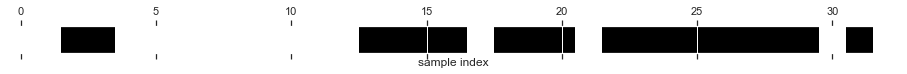

In [625]:
mask=rfe_rfc.get_support()
plt.matshow(mask.reshape(1,-1),cmap="gray_r")
plt.xlabel("sample index")
plt.yticks(())
plt.show()

In [626]:
x_test_selected=rfe_rfc.transform(x_test)

rfe_rfc.fit(x_train,y_train.values.ravel())

print("Scores with all features :{:,.3f}".format(rfe_rfc.score(x_test,y_test)))


Scores with all features :0.940


In [627]:
rfe_rfc.fit(x_train_selected,y_train.values.ravel())

print("Scores with selected features :{:,.3f}".format(rfe_rfc.score(x_test_selected,y_test)))

Scores with selected features :0.940


In [628]:
# evaluate RFE for classification
from numpy import mean
from numpy import std
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
# define dataset

rfe = RFE(estimator=DecisionTreeClassifier(criterion="entropy",max_depth=10,max_leaf_nodes=100), n_features_to_select=18)
model = DecisionTreeClassifier()
pipeline = Pipeline(steps=[('s',rfe),('m',model)])
# evaluate model
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(pipeline, x, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))


Accuracy: 0.901 (0.008)


In [646]:
'''def run_randomForest(x_train,x_test,y_train,y_test):
    from sklearn.feature_selection import RFE
    rfe_grad=RFE(GradientBoostingClassifier(n_estimators=100,max_depth=10,max_features=18,max_leaf_nodes=100))
    rfe_grad=rfe_grad.fit(x_train,y_train)
    pred_model=rfe_grad.predict(x_test)
    print("accuracy:",accuracy_score(y_test,pred_model))'''

'def run_randomForest(x_train,x_test,y_train,y_test):\n    from sklearn.feature_selection import RFE\n    rfe_grad=RFE(GradientBoostingClassifier(n_estimators=100,max_depth=10,max_features=18,max_leaf_nodes=100))\n    rfe_grad=rfe_grad.fit(x_train,y_train)\n    pred_model=rfe_grad.predict(x_test)\n    print("accuracy:",accuracy_score(y_test,pred_model))'

In [647]:
'''%%time
run_randomForest(x_train,x_test,y_train.values.ravel(),y_test)'''

'%%time\nrun_randomForest(x_train,x_test,y_train.values.ravel(),y_test)'

In [ ]:
from sklearn import metrics
k_range=range(1,37)
scores=[]
for k in k_range:
    sel=RFE(GradientBoostingClassifier(n_estimators=100,random_state=10,max_depth=10,max_leaf_nodes=100),n_features_to_select=k)
    sel.fit(x_train,y_train.values.ravel())
    y_pred=sel.predict(x_test)
    print("Selcted feature :",k)
   # scores.append(metrics.accuracy_score(y_test,y_pred))
    print (metrics.accuracy_score(y_test,y_pred))
    print()

Selcted feature : 1
0.8974709501025291

Selcted feature : 2
0.9172932330827067

Selcted feature : 3
0.9251537935748462



In [1075]:
sel=RFE(GradientBoostingClassifier(n_estimators=100,random_state=10),n_features_to_select=18)
sel.fit(x_train,y_train.values.ravel())
y_pred=sel.predict(x_test)
print("Selcted feature :",18)
# scores.append(metrics.accuracy_score(y_test,y_pred))
print (metrics.accuracy_score(y_test,y_pred))

Selcted feature : 18
0.9354066985645934


In [1076]:
gradient_rfe=x_train.columns[sel.get_support()]

In [1077]:
gradient_rfe

Index(['hh_education', 'residence', 'altitude', 'Q306', 'house_equipment',
       'Qanimal', 'Q501', 'Q503', 'Q5042', 'Q506', 'Q508', 'Q510', 'Q512',
       'Q514', 'Q516', 'Q518', 'Q5261', 'Q5263'],
      dtype='object')

In [447]:
from sklearn import metrics
k_range=range(1,37)
scores=[]
for index in k_range:
    rand=RFE(RandomForestClassifier(n_estimators=100,random_state=10,max_depth=10,max_leaf_nodes=100),n_features_to_select=index)
    rand.fit(x_train,y_train.values.ravel())
    y_pred_rand=rand.predict(x_test)
    print("Selcted feature :",index)
   # scores.append(metrics.accuracy_score(y_test,y_pred))
    print (metrics.accuracy_score(y_test,y_pred_rand))
    print()

Selcted feature : 1
0.8882433356117566

Selcted feature : 2
0.9190020505809979

Selcted feature : 3
0.9251537935748462

Selcted feature : 4
0.9268626110731374

Selcted feature : 5
0.9261790840738209

Selcted feature : 6
0.9285714285714286

Selcted feature : 7
0.9295967190704033

Selcted feature : 8
0.9285714285714286

Selcted feature : 9
0.9289131920710868

Selcted feature : 10
0.9295967190704033

Selcted feature : 11
0.9295967190704033

Selcted feature : 12
0.935064935064935

Selcted feature : 13
0.935064935064935

Selcted feature : 14
0.9354066985645934

Selcted feature : 15
0.9336978810663021

Selcted feature : 16
0.9343814080656186

Selcted feature : 17
0.9343814080656186

Selcted feature : 18
0.9371155160628845

Selcted feature : 19
0.935064935064935

Selcted feature : 20
0.9364319890635681

Selcted feature : 21
0.9367737525632263

Selcted feature : 22
0.9347231715652768

Selcted feature : 23
0.935064935064935

Selcted feature : 24
0.9364319890635681

Selcted feature : 25
0.936431

In [652]:
rfr=RFE(RandomForestClassifier(n_estimators=100,random_state=10,max_depth=10,max_leaf_nodes=100),n_features_to_select=18)
rfr.fit(x_train,y_train.values.ravel())
y_rfr=rfr.predict(x_test)
print (metrics.accuracy_score(y_test,y_rfr))

0.9392795883361921


In [653]:
rand_rfe=x_train.columns[rfr.get_support()]

In [654]:
rand_rfe

Index(['hh_education', 'main_occupation', 'Q306', 'Q307', 'Q308m',
       'Qsou_inform', 'house_equipment', 'Qanimal', 'Q501', 'Q504', 'Q506',
       'Q508', 'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q525'],
      dtype='object')

In [655]:
### Recursive feature selection classifiers 
# Recursive Feature Elimination
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# create a base classifier used to evaluate a subset of attributes
model = LogisticRegression()
# create the RFE model and select 35 attributes
rfe = RFE(model, 18)
rfe = rfe.fit(x_train,y_train.values.ravel())
y_pred_lr=rfe.predict(x_test)
print(accuracy_score(y_test,y_pred_lr))
# summarize the selection of the attributes
print(rfe.support_)
print(rfe.ranking_)


0.9262435677530018
[False False False  True False  True  True  True  True False  True False
 False  True False False False False  True False False False False  True
  True  True  True  True  True  True  True  True  True]
[ 5 11  3  1  9  1  1  1  1  6  1 14 10  1 15 13  7 16  1 12  8  2  4  1
  1  1  1  1  1  1  1  1  1]


In [656]:
rfe.get_support()


array([False, False, False,  True, False,  True,  True,  True,  True,
       False,  True, False, False,  True, False, False, False, False,
        True, False, False, False, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

In [657]:
lr=x_train.columns[rfe.get_support()]
lr

Index(['main_occupation', 'residence', 'age', 'altitude', 'Q401', 'Q301',
       'Q306', 'house_equipment', 'Q506', 'Q508', 'Q510', 'Q512', 'Q514',
       'Q516', 'Q518', 'Q525', 'Q5261', 'Q5263'],
      dtype='object')

In [658]:
from sklearn import metrics
k_range=range(1,37)
scores=[]
model_lr = LogisticRegression()
for index in k_range:
    lrr=RFE(model_lr,n_features_to_select=index)
    rff=lrr.fit(x_train,y_train.values.ravel())
    y_pred_lr=rff.predict(x_test)
    print("Selcted feature :",index)
    #scores.append(metrics.accuracy_score(y_test,y_pred_lr))
    print (metrics.accuracy_score(y_test,y_pred_lr))
    print()


Selcted feature : 1
0.8926243567753002

Selcted feature : 2
0.9087478559176673

Selcted feature : 3
0.9097770154373928

Selcted feature : 4
0.9104631217838765

Selcted feature : 5
0.9197255574614065

Selcted feature : 6
0.9183533447684391

Selcted feature : 7
0.9224699828473414

Selcted feature : 8
0.9241852487135506

Selcted feature : 9
0.9248713550600343

Selcted feature : 10
0.9221269296740995

Selcted feature : 11
0.9238421955403088

Selcted feature : 12
0.9234991423670669

Selcted feature : 13
0.9231560891938251

Selcted feature : 14
0.9248713550600343

Selcted feature : 15
0.9241852487135506

Selcted feature : 16
0.9252144082332762

Selcted feature : 17
0.9269296740994855

Selcted feature : 18
0.9262435677530018

Selcted feature : 19
0.9262435677530018

Selcted feature : 20
0.9262435677530018

Selcted feature : 21
0.9279588336192109

Selcted feature : 22
0.9279588336192109

Selcted feature : 23
0.9279588336192109

Selcted feature : 24
0.9279588336192109

Selcted feature : 25
0.92

In [659]:
model_lr = LogisticRegression()
lrr=RFE(model_lr,n_features_to_select=18)
rff=lrr.fit(x_train,y_train.values.ravel())
y_pred_lr=rff.predict(x_test)
print("Selcted feature :",18)
print()
   # scores.append(metrics.accuracy_score(y_test,y_pred))
print (metrics.accuracy_score(y_test,y_pred_lr))


Selcted feature : 18

0.9262435677530018


In [660]:
lr_rfe=x_train.columns[rff.get_support()]

In [661]:
lr_rfe

Index(['main_occupation', 'residence', 'age', 'altitude', 'Q401', 'Q301',
       'Q306', 'house_equipment', 'Q506', 'Q508', 'Q510', 'Q512', 'Q514',
       'Q516', 'Q518', 'Q525', 'Q5261', 'Q5263'],
      dtype='object')

Exhaustive Feature Selection

In [ ]:
# import the algorithm you want to evaluate on your features.
from sklearn.ensemble import RandomForestClassifier

from mlxtend.feature_selection import ExhaustiveFeatureSelector as EFS
#efs=EFS(RandomForestClassifier(n_estimators=100,random_state=0,n_jobs=-1)
           
# create the ExhaustiveFeatureSelector object.
efs = EFS(RandomForestClassifier(n_estimators=100,random_state=0,n_jobs=-1),
          min_features=4,
          max_features=10,
          scoring='roc_auc',
          cv=4,n_jobs=-1).fit(x_train, y_train.values.ravel())        
                               
# fit the object to the training data.
#efs = efs.fit(x_train, y_train)

# print the selected features.
selected_features = x_train.columns[list(efs.k_feature_idx_)]
print(selected_features)



In [ ]:
# print the final prediction score.
print(efs.k_score_)

# transform our data to the newly selected features.
x_train_sfs = efs.transform(x_train)
x_test_sfs = efs.transform(x_test)

efs.best_score_

In [ ]:
efs.best_feature_names_

In [ ]:
efs.best_idx

In [ ]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
plot_sfs(efe.get_metric_dict(),kind='std_dev')

Embedded Methods

In [302]:
# Lasso for Regression tasks, and Logistic Regression for Classification tasks.
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.feature_selection import SelectFromModel

# using logistic regression with penalty l1.
selection = SelectFromModel(LogisticRegression(C=1, penalty='l1'))
selection.fit(x_train, y_train.values.ravel())

# see the selected features.
selected_features = x_train.columns[(selection.get_support())]

# see the deleted features.
removed_features = x_train.columns[(selection.estimator_.coef_ == 0).ravel().tolist()]

In [303]:
selected_features

Index(['hh_members', 'hh_education', 'main_occupation', 'marital_status',
       'residence', 'age', 'altitude', 'Q401', 'Q406', 'Q301', 'Q304', 'Q306',
       'Q307', 'Q308m', 'Qsou_inform', 'Qtransport', 'house_equipment',
       'Qanimal', 'Q501', 'Q503', 'Q5041', 'Q5042', 'Q5043', 'Q5044', 'Q506',
       'Q508', 'Q510', 'Q512', 'Q514', 'Q516', 'Q518', 'Q525', 'Q5261',
       'Q5263'],
      dtype='object')

In [304]:
selected_features.shape

(34,)

In [305]:
removed_features

Index(['sex', 'Q302'], dtype='object')

In [306]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score

from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix,classification_report,roc_auc_score
import matplotlib.pyplot as plt
model_extr=ExtraTreesClassifier(criterion='entropy')
model_extr.fit(x_train,y_train.values.ravel())
extra=model_extr.predict(x_test)

In [307]:
print(classification_report(y_test,extra))
print("accuracy for ExtrTreeClassifiers:"),(accuracy_score(y_test,extra))*100 


              precision    recall  f1-score   support

           1       0.94      0.94      0.94      2462
           2       0.93      0.92      0.92      1921

    accuracy                           0.93      4383
   macro avg       0.93      0.93      0.93      4383
weighted avg       0.93      0.93      0.93      4383

accuracy for ExtrTreeClassifiers:


(None, 93.22381930184805)

In [308]:
print(model_extr.feature_importances_)

[0.01428208 0.00641364 0.0199637  0.01019745 0.00933061 0.00872037
 0.01555326 0.0108853  0.0078886  0.00352461 0.00822713 0.00062782
 0.00595797 0.01394053 0.01099925 0.00843615 0.01277423 0.00861689
 0.0151779  0.01499862 0.01822071 0.01133024 0.00618711 0.01293927
 0.0029263  0.00545922 0.0678109  0.11838562 0.12248345 0.06568374
 0.13193385 0.19331679 0.00389395 0.01385729 0.01262962 0.00642584]


In [309]:
print("ROC  for ExtrTreeClassifiers:",roc_auc_score(y_test,extra)) 

ROC  for ExtrTreeClassifiers: 0.9304749210381982


Build model without classifiers

In [310]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
LogisticRegression(solver='lbfgs')
# Feature extraction
model = LogisticRegression()
rfe = RFE(model, 15)
fit_rfe = rfe.fit(x_train, y_train.values.ravel())
pred_mod=fit_rfe.predict(x_test)
print(" the accuracy of the model  using Lr clasifier is:",accuracy_score(y_test,pred_mod))
print("Num Features: %s" % (fit_rfe.n_features_))
print("Selected Features: %s" % (fit_rfe.support_))
print("Feature Ranking: %s" % (fit_rfe.ranking_))

 the accuracy of the model  using Lr clasifier is: 0.9253935660506503
Num Features: 15
Selected Features: [False False False False False False False False False  True  True False
 False False False False False False False False False  True  True  True
  True False  True  True  True  True  True  True  True False  True  True]
Feature Ranking: [12 18 19  6 22 17  9 13  4  1  1 10  5  3 21  2  7 16 11 15 14  1  1  1
  1 20  1  1  1  1  1  1  1  8  1  1]


In [311]:
#Using random forest classifiers
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from sklearn.ensemble import RandomForestClassifier

rfc=RandomForestClassifier(n_estimators=100,bootstrap=True,max_features=15,criterion='entropy',max_leaf_nodes=10)

rfc.fit(x_train,y_train.values.ravel())

pred_rfc=rfc.predict(x_test)

In [312]:
from sklearn.metrics import accuracy_score,roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix,classification_report

print(classification_report(y_test,pred_rfc))

              precision    recall  f1-score   support

           1       0.94      0.94      0.94      2462
           2       0.92      0.92      0.92      1921

    accuracy                           0.93      4383
   macro avg       0.93      0.93      0.93      4383
weighted avg       0.93      0.93      0.93      4383



In [313]:
print("accuracy for random forest classifiers:",accuracy_score(y_test,pred_rfc))

accuracy for random forest classifiers: 0.9308692676249144


In [314]:
print("roc for random forest classifiers:",roc_auc_score(y_test,pred_rfc))

roc for random forest classifiers: 0.9293135936933741


In [315]:
print(confusion_matrix(y_test,pred_rfc))

[[2319  143]
 [ 160 1761]]


In [316]:
rfc.score(x_test,y_test)*100

93.08692676249144

In [317]:
print("Roc auc score :",roc_auc_score(y_test,pred_rfc))

Roc auc score : 0.9293135936933741


In [318]:
#Using support vetor machine
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
from sklearn import svm
Svm=svm.SVC()
Svm.fit(x_train,y_train.values.ravel())
pred_Svm=Svm.predict(x_test)

In [319]:
print(" Therefore accuracy for SVM:",(accuracy_score(y_test,pred_Svm))*100)

 Therefore accuracy for SVM: 93.52041980378736


In [773]:
#def run_RandomForest(x_train,x_test,y_train,y_test):
rf=RandomForestClassifier(n_estimators=100,random_state=0,n_jobs=-1,max_features=18,max_depth=10,criterion='entropy',max_leaf_nodes=100)
rf.fit(x_train,y_train.values.ravel())
y_pred_ran=rf.predict(x_test)
print("Accuracy :",accuracy_score(y_test,y_pred_ran))
    

Accuracy : 0.9365351629502573


In [774]:
%%time
run_RandomForest(x_train,x_test,y_train,y_test)


Accuracy : 0.9365351629502573
Wall time: 1.01 s


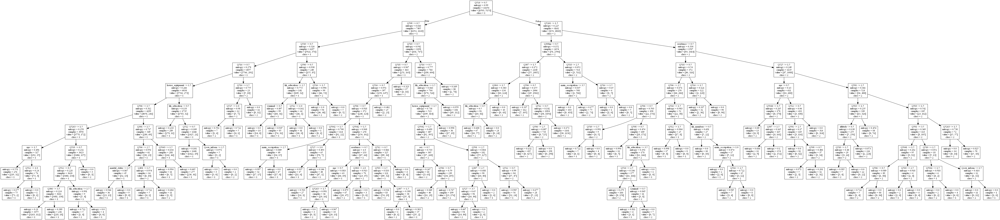

In [591]:
import pydotplus
import sklearn.tree as tree
from IPython.display import Image

dt_feature_names = x_train.columns
tree.export_graphviz(clf, out_file='tree.dot', 
    feature_names=dt_feature_names,class_names=['1','2'],
    filled=False)  
graph = pydotplus.graph_from_dot_file('tree.dot')
Image(graph.create_png())

In [327]:
x_train.shape,x_test.shape

((10226, 36), (4383, 36))

In [328]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier(n_neighbors=11)
knn.fit(x_train,y_train.values.ravel())
y_pred=knn.predict(x_test)
print (accuracy_score(y_test,y_pred))

0.9221994067989961


In [331]:
from sklearn import metrics
k_range=range(1,37)
scores=[]
for k in k_range:
    knn=KNeighborsClassifier(n_neighbors=k)
    knn.fit(x_train,y_train.values.ravel())
    y_pred=knn.predict(x_test)
    print("Selcted feature :",k)
    print()
    #scores.append(metrics.accuracy_score(y_test,y_pred))
    print (metrics.accuracy_score(y_test,y_pred))
   

Selcted feature : 1

0.9032626055213324
Selcted feature : 2

0.8986995208761123
Selcted feature : 3

0.919005247547342
Selcted feature : 4

0.9137577002053389
Selcted feature : 5

0.921286789869952
Selcted feature : 6

0.9180926306182979
Selcted feature : 7

0.9231120237280401
Selcted feature : 8

0.919917864476386
Selcted feature : 9

0.921286789869952
Selcted feature : 10

0.919689710244125
Selcted feature : 11

0.9221994067989961
Selcted feature : 12

0.919461556011864
Selcted feature : 13

0.9226557152635181
Selcted feature : 14

0.9208304814054301
Selcted feature : 15

0.9203741729409081
Selcted feature : 16

0.919233401779603
Selcted feature : 17

0.9210586356376911
Selcted feature : 18

0.919233401779603
Selcted feature : 19

0.9203741729409081
Selcted feature : 20

0.9164955509924709
Selcted feature : 21

0.919461556011864
Selcted feature : 22

0.9174081679215149
Selcted feature : 23

0.919005247547342
Selcted feature : 24

0.9174081679215149
Selcted feature : 25

0.91672370522

In [754]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

In [572]:

# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion='entropy',max_depth=10,max_features=18,max_leaf_nodes=100)

# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train.values.ravel())

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [573]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",accuracy_score(y_test, y_pred))

Accuracy: 0.9307032590051458


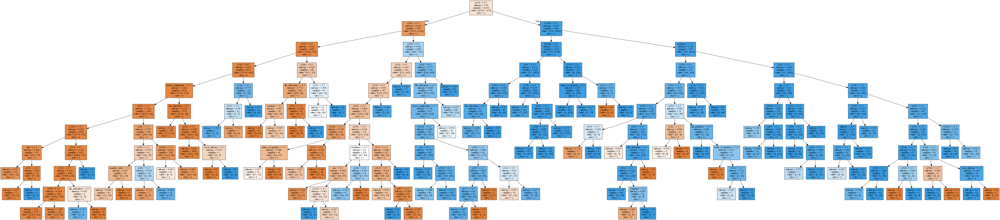

In [574]:
import pydotplus
import sklearn.tree as tree
from IPython.display import Image

dt_feature_names = x_train.columns
tree.export_graphviz(clf, out_file='tree.dot', 
    feature_names=dt_feature_names,class_names=['1','2'],
    filled=True)  
graph = pydotplus.graph_from_dot_file('tree.dot')
Image(graph.create_png())

In [592]:
from sklearn.tree import _tree
def get_lineage(tree, feature_names):
    left      = tree.tree_.children_left
    right     = tree.tree_.children_right
    threshold = tree.tree_.threshold
    features  = [feature_names[i] for i in tree.tree_.feature]

     # get ids of child nodes
    idx = np.argwhere(left == -1)[:,0]     

    def recurse(left, right, child, lineage=None):          
        if lineage is None:
               lineage = [child]
        if child in left:
            parent = np.where(left == child)[0].item()
            split = 'l'
        else:
            parent = np.where(right == child)[0].item()
            split = 'r'

        lineage.append((parent, split, threshold[parent], features[parent]))

        if parent == 0:
            lineage.reverse()
            return lineage
        else:
            return recurse(left, right, parent, lineage)

        for child in idx:
            for node in recurse(left, right, child):
                print(node)

In [623]:
def get_code(tree, feature_names):
        left      = tree.tree_.children_left
        right     = tree.tree_.children_right
        threshold = tree.tree_.threshold
        features  = [feature_names[i] for i in tree.tree_.feature]
        value = tree.tree_.value

        def recurse(left, right, threshold, features, node):
            if (threshold[node] != -2):
                print " if ( + features[node] + " <= " + str(threshold[node]) +  ) 
                      {"
                 if left[node] != -1:
                            recurse (left, right, threshold, features,left[node])
                print "} 
                         else {"
                        if right[node] != -1:
                                recurse (left, right, threshold, features,right[node])
                        print "}"
                else:
                        print "return " + str(value[node])

        recurse(left, right, threshold, features, 0)


SyntaxError: invalid syntax (<ipython-input-623-70365ece1eb9>, line 10)

# Bagging Algorithms

In [335]:
import pandas
from sklearn import model_selection
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
kfold = model_selection.KFold(n_splits=10, random_state=0)

In [336]:
cart = DecisionTreeClassifier()
model = BaggingClassifier(base_estimator=cart, n_estimators=100, random_state=0)
results = model_selection.cross_val_score(model, x, y.values.ravel(), cv=kfold)

In [337]:
print(results.mean())

0.9262080766598221


In [759]:
import pandas
from sklearn import model_selection
from sklearn.ensemble import RandomForestClassifier
max_features = 18
kfold = model_selection.KFold(n_splits=10, random_state=0)
model = RandomForestClassifier(n_estimators=100, max_features=max_features,criterion="entropy",max_depth=10,max_leaf_nodes=100)

In [760]:
results = model_selection.cross_val_score(model, x, y.values.ravel(), cv=kfold)


In [761]:
print(results.mean())

0.933015912020208


In [762]:
results

array([0.95816187, 0.96156486, 0.96431023, 0.93891558, 0.89773507,
       0.94715168, 0.93891558, 0.89018531, 0.93548387, 0.89773507])

In [341]:
# Extra Trees Classification
import pandas
from sklearn import model_selection
from sklearn.ensemble import ExtraTreesClassifier

max_features =18
kfold = model_selection.KFold(n_splits=10, random_state=0)
model = ExtraTreesClassifier(n_estimators=100, max_features=max_features)

In [342]:
results = model_selection.cross_val_score(model,x, y.values.ravel(), cv=kfold)


In [343]:
print(results.mean())

0.9255236139630391


In [344]:
# AdaBoost Classification
import pandas
from sklearn import model_selection
from sklearn.ensemble import AdaBoostClassifier

kfold = model_selection.KFold(n_splits=10, random_state=7)
model = AdaBoostClassifier(n_estimators=30, random_state=7)

In [345]:
results = model_selection.cross_val_score(model, x,y.values.ravel(), cv=kfold)
print(results.mean())

0.9262062951815702


In [346]:
import pandas
from sklearn import model_selection
from sklearn.ensemble import GradientBoostingClassifier

kfold = model_selection.KFold(n_splits=10, random_state=7)
model = GradientBoostingClassifier(n_estimators=100, random_state=7)

In [347]:
results = model_selection.cross_val_score(model, x,y.values.ravel(), cv=kfold)
print(results.mean())

0.9348321659962682


In [763]:
train_accuracy=[]
validation_accuracy=[]
for k in range(1,20):
    dt_model=DecisionTreeClassifier(max_depth=k,random_state=0)
    dt_model.fit(x_train,y_train)
    train_accuracy.append(dt_model.score(x_train,y_train))
    validation_accuracy.append(dt_model.score(x_test,y_test))
    

In [764]:
frame=pd.DataFrame({'max_depth':range(1,20),'train_acc':train_accuracy,'valid_acc':validation_accuracy})
frame   


,max_depth,train_acc,valid_acc
0,1,0.897306,0.895712
1,2,0.919355,0.921784
2,3,0.925360,0.926587
3,4,0.929307,0.930017
4,5,0.930937,0.928645
5,6,0.937200,0.931046
6,7,0.940717,0.927273
7,8,0.945436,0.927273
8,9,0.950240,0.925214
9,10,0.955474,0.925214


No handles with labels found to put in legend.


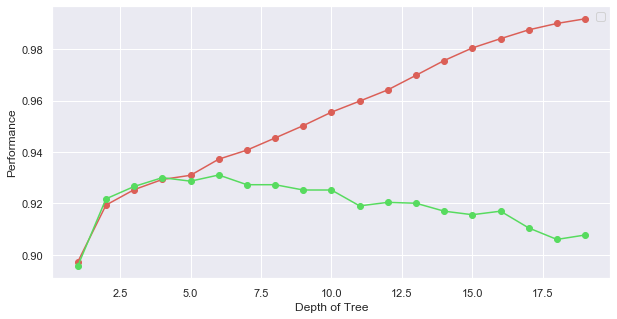

In [765]:
plt.figure(figsize=(10,5))
plt.plot(frame['max_depth'],frame['train_acc'],marker='o')
plt.plot(frame['max_depth'],frame['valid_acc'],marker='o')
plt.xlabel("Depth of Tree")
plt.ylabel("Performance")
plt.legend()

In [348]:
import pandas
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier

kfold = model_selection.KFold(n_splits=10, random_state=0)
# create the sub models
estimators = []
model1 = LogisticRegression()
estimators.append(('logistic', model1))
model2 = DecisionTreeClassifier()
estimators.append(('cart', model2))
model3 = SVC()
estimators.append(('svm', model3))
# create the ensemble model
ensemble = VotingClassifier(estimators)
results = model_selection.cross_val_score(ensemble, x,y.values.ravel(), cv=kfold)
print(results.mean())

0.9295608656109066


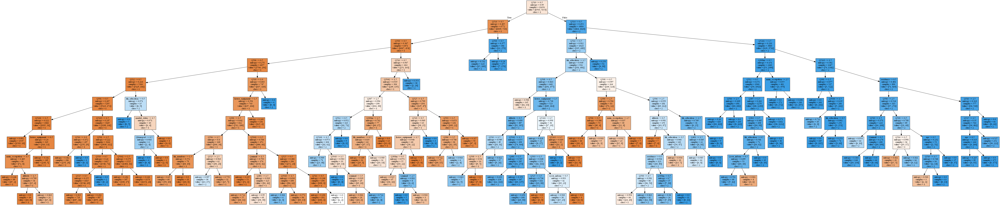

In [795]:
from sklearn.tree import _tree
def find_rules(tree,xx):
    dt= tree.tree_
    def visitor(node, depth):
        indent = '' * depth
        if dt.xx[node] != _tree.TREE_UNDEFINED:
            print('{} if <{}> <={}:'.format(indent,xx[node],round(dt.threshold[node],2)))
            visitor(dt.children_left[node], depth +1)
            print('{} else:'.format(indent))
            visitor(dt.children_right[node],depth +1 )
        else:print('{} return {}'.format(indent,dt.value[node]))
    visitor(0,1)
    

In [796]:
find_rules(clf,x)

AttributeError: 'sklearn.tree._tree.Tree' object has no attribute 'xx'

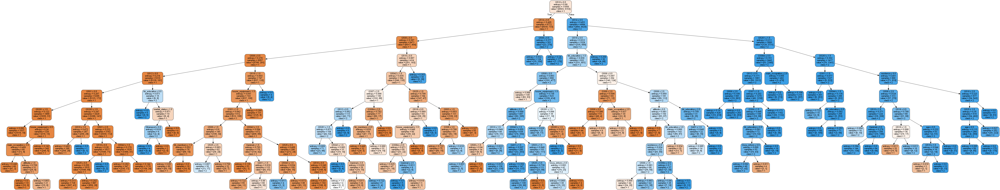

In [797]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                max_depth=10,
                feature_names = x_train.columns,class_names=['1','2'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('gggg.png')
Image(graph.create_png())

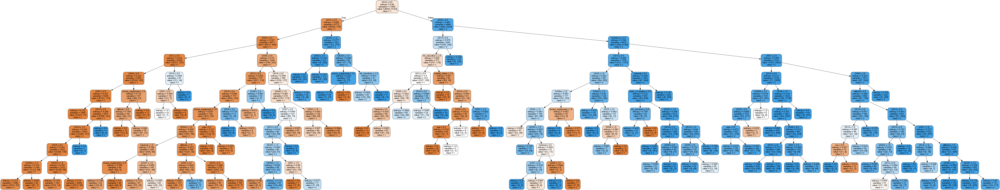

In [279]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                max_depth=20,feature_names = x_train.columns,class_names=['1','2'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('foodsecure.png')
Image(graph.create_png())

In [798]:
all_merged.shape

(14571, 39)

In [799]:
x_train.shape

(11656, 36)

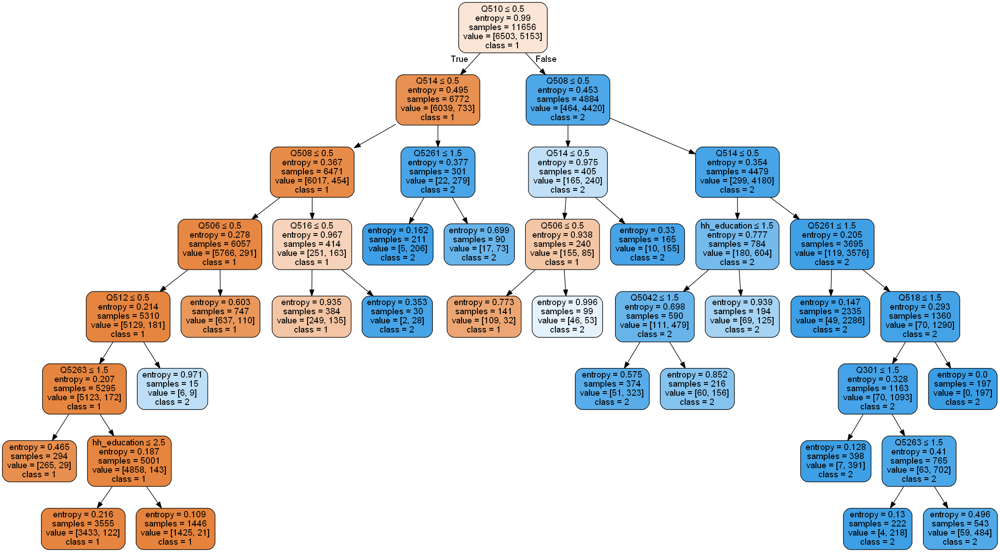

In [281]:
from sklearn.tree import DecisionTreeClassifier
import sklearn.datasets as datasets
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz

import pandas as pd
import pydotplus

from IPython.display import Image

dtree = DecisionTreeClassifier(criterion='entropy',max_depth=10,max_features=18,max_leaf_nodes=20)
dtree.fit(x_train,y_train)

dot_data = StringIO()
export_graphviz(
    dtree, 
    out_file = dot_data,
    filled = True, 
    rounded = True,
    feature_names=x_train.columns,
    class_names=['1','2'],
    special_characters = True
)
graph_1 = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph_1.create_png())

In [1948]:
clf = DecisionTreeClassifier(criterion='entropy',max_depth=10,max_features=18,max_leaf_nodes=50)

# Train Decision Tree Classifer
clf = clf.fit(x_train_chi,y_train)
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
yy=y_train
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = x_train_chi.columns,class_names=['1','2'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('yyyy.png')
Image(graph.create_png())

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


NotFittedError: This RandomForestClassifier instance is not fitted yet. Call 'fit' with appropriate arguments before using this method.

In [357]:
all_merged.shape

(14609, 42)

In [358]:
all_merged.to_csv("C:/Users/Melaku/Desktop/bb/ddf.csv")

In [359]:
x_train.to_csv("C:/Users/Melaku/Desktop/bb/x_train.csv")